<a href="https://colab.research.google.com/github/anas1IA/Analysis-of-Bank-Debit-Collections/blob/main/first_project_change).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [61]:
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
from mlxtend.preprocessing import minmax_scaling
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
# separate dataset into train and test
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2



## the transformation of data from a text file to a CSV


In [62]:
data_1year=pd.read_csv('csv_result-1year.csv')
data_2year=pd.read_csv('csv_result-2year .csv')
data_3year=pd.read_csv('csv_result-3year.csv')
data_4year=pd.read_csv('csv_result-4year.csv')
data_5year=pd.read_csv('csv_result-5year.csv')
all_data = pd.concat([data_1year, data_2year, data_3year, data_4year, data_5year], ignore_index=True)
all_data

<ipython-input-62-9e51fdb42de8>:2: DtypeWarning: Columns (1,2,3,6,7,9,10,11,14,18,22,24,25,29,35,36,38,48,51,55,57,59) have mixed types. Specify dtype option on import or set low_memory=False.
  data_2year=pd.read_csv('csv_result-2year .csv')
<ipython-input-62-9e51fdb42de8>:3: DtypeWarning: Columns (15,24) have mixed types. Specify dtype option on import or set low_memory=False.
  data_3year=pd.read_csv('csv_result-3year.csv')
<ipython-input-62-9e51fdb42de8>:4: DtypeWarning: Columns (1,2,3,6,7,8,10,11,14,15,16,17,18,22,24,25,26,29,34,35,36,38,48,50,51,57,59) have mixed types. Specify dtype option on import or set low_memory=False.
  data_4year=pd.read_csv('csv_result-4year.csv')


,id,Attr1,Attr2,Attr3,Attr4,Attr5,Attr6,Attr7,Attr8,Attr9,...,Attr56,Attr57,Attr58,Attr59,Attr60,Attr61,Attr62,Attr63,Attr64,class
0,1,0.20055,0.37951,0.39641,2.0472,32.351,0.38825,0.24976,1.3305,1.1389,...,0.12196,0.39718,0.87804,0.001924,8.416,5.1372,82.658,4.4158,7.4277,0
1,2,0.20912,0.49988,0.47225,1.9447,14.786,0,0.25834,0.99601,1.6996,...,0.1213,0.42002,0.853,0,4.1486,3.2732,107.35,3.4,60.987,0
2,3,0.24866,0.69592,0.26713,1.5548,-1.1523,0,0.30906,0.43695,1.309,...,0.24114,0.81774,0.76599,0.69484,4.9909,3.951,134.27,2.7185,5.2078,0
3,4,0.081483,0.30734,0.45879,2.4928,51.952,0.14988,0.092704,1.8661,1.0571,...,0.054015,0.14207,0.94598,0,4.5746,3.6147,86.435,4.2228,5.5497,0
4,5,0.18732,0.61323,0.2296,1.4063,-7.3128,0.18732,0.18732,0.6307,1.1559,...,0.13485,0.48431,0.86515,0.12444,6.3985,4.3158,127.21,2.8692,7.898,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43400,5906,0.012898,0.70621,0.038857,1.1722,-18.907,0,0.013981,0.416,1.6768,...,0.020169,0.043904,1.0122,1.2594,13.472,12.432,49.117,7.4313,2.2799,1
43401,5907,-0.57805,0.96702,-0.80085,0.16576,-67.365,-0.57805,-0.57805,-0.40334,0.93979,...,-0.064073,1.482,1.0641,-0.018084,110.72,44.759,81.22,4.494,5.1305,1
43402,5908,-0.17905,1.2553,-0.27599,0.74554,-120.44,-0.17905,-0.15493,-0.26018,1.1749,...,0.14888,0.54824,0.85112,-0.52243,9.8526,3.4892,207.87,1.7559,9.9527,1
43403,5909,-0.10886,0.74394,0.015449,1.0878,-17.003,-0.10886,-0.10918,0.12531,0.84516,...,-0.1832,-1.1677,1.1832,6.0924,13.886,6.0769,83.122,4.3911,0.95575,1


In [63]:
formulas = ["id",
    "net profit / total assets",
    "total liabilities / total assets",
    "working capital / total assets",
    "current assets / short-term liabilities",
    "(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365",
    "retained earnings / total assets",
    "EBIT / total assets",
    "book value of equity / total liabilities",
    "sales / total assets",
    "equity / total assets",
    "(gross profit + extraordinary items + financial expenses) / total assets",
    "gross profit / short-term liabilities",
    "(gross profit + depreciation) / sales",
    "(gross profit + interest) / total assets",
    "(total liabilities * 365) / (gross profit + depreciation)",
    "(gross profit + depreciation) / total liabilities",
    "total assets / total liabilities",
    "gross profit / total assets",
    "gross profit / sales",
    "(inventory * 365) / sales",
    "sales (n) / sales (n-1)",
    "profit on operating activities / total assets",
    "net profit / sales",
    "gross profit (in 3 years) / total assets",
    "(equity - share capital) / total assets",
    "(net profit + depreciation) / total liabilities",
    "profit on operating activities / financial expenses",
    "working capital / fixed assets",
    "logarithm of total assets",
    "(total liabilities - cash) / sales",
    "(gross profit + interest) / sales",
    "(current liabilities * 365) / cost of products sold",
    "operating expenses / short-term liabilities",
    "operating expenses / total liabilities",
    "profit on sales / total assets",
    "total sales / total assets",
    "(current assets - inventories) / long-term liabilities",
    "constant capital / total assets",
    "profit on sales / sales",
    "(current assets - inventory - receivables) / short-term liabilities",
    "total liabilities / ((profit on operating activities + depreciation) * (12/365))",
    "profit on operating activities / sales",
    "rotation receivables + inventory turnover in days",
    "(receivables * 365) / sales",
    "net profit / inventory",
    "(current assets - inventory) / short-term liabilities",
    "(inventory * 365) / cost of products sold",
    "EBITDA (profit on operating activities - depreciation) / total assets",
    "EBITDA (profit on operating activities - depreciation) / sales",
    "current assets / total liabilities",
    "short-term liabilities / total assets",
    "(short-term liabilities * 365) / cost of products sold",
    "equity / fixed assets",
    "constant capital / fixed assets",
    "working capital",
    "(sales - cost of products sold) / sales",
    "(current assets - inventory - short-term liabilities) / (sales - gross profit - depreciation)",
    "total costs / total sales",
    "long-term liabilities / equity",
    "sales / inventory",
    "sales / receivables",
    "(short-term liabilities * 365) / sales",
    "sales / short-term liabilities",
    "sales / fixed assets",
    "bankruptcy status",
]


In [64]:
all_data.columns=formulas
all_data

,id,net profit / total assets,total liabilities / total assets,working capital / total assets,current assets / short-term liabilities,(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365,retained earnings / total assets,EBIT / total assets,book value of equity / total liabilities,sales / total assets,...,(sales - cost of products sold) / sales,(current assets - inventory - short-term liabilities) / (sales - gross profit - depreciation),total costs / total sales,long-term liabilities / equity,sales / inventory,sales / receivables,(short-term liabilities * 365) / sales,sales / short-term liabilities,sales / fixed assets,bankruptcy status
0,1,0.20055,0.37951,0.39641,2.0472,32.351,0.38825,0.24976,1.3305,1.1389,...,0.12196,0.39718,0.87804,0.001924,8.416,5.1372,82.658,4.4158,7.4277,0
1,2,0.20912,0.49988,0.47225,1.9447,14.786,0,0.25834,0.99601,1.6996,...,0.1213,0.42002,0.853,0,4.1486,3.2732,107.35,3.4,60.987,0
2,3,0.24866,0.69592,0.26713,1.5548,-1.1523,0,0.30906,0.43695,1.309,...,0.24114,0.81774,0.76599,0.69484,4.9909,3.951,134.27,2.7185,5.2078,0
3,4,0.081483,0.30734,0.45879,2.4928,51.952,0.14988,0.092704,1.8661,1.0571,...,0.054015,0.14207,0.94598,0,4.5746,3.6147,86.435,4.2228,5.5497,0
4,5,0.18732,0.61323,0.2296,1.4063,-7.3128,0.18732,0.18732,0.6307,1.1559,...,0.13485,0.48431,0.86515,0.12444,6.3985,4.3158,127.21,2.8692,7.898,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43400,5906,0.012898,0.70621,0.038857,1.1722,-18.907,0,0.013981,0.416,1.6768,...,0.020169,0.043904,1.0122,1.2594,13.472,12.432,49.117,7.4313,2.2799,1
43401,5907,-0.57805,0.96702,-0.80085,0.16576,-67.365,-0.57805,-0.57805,-0.40334,0.93979,...,-0.064073,1.482,1.0641,-0.018084,110.72,44.759,81.22,4.494,5.1305,1
43402,5908,-0.17905,1.2553,-0.27599,0.74554,-120.44,-0.17905,-0.15493,-0.26018,1.1749,...,0.14888,0.54824,0.85112,-0.52243,9.8526,3.4892,207.87,1.7559,9.9527,1
43403,5909,-0.10886,0.74394,0.015449,1.0878,-17.003,-0.10886,-0.10918,0.12531,0.84516,...,-0.1832,-1.1677,1.1832,6.0924,13.886,6.0769,83.122,4.3911,0.95575,1


## Data Cleaning


###Handling Missing Values


In [65]:
all_data_rest = all_data.astype(str)
all_data.replace("?", float('nan'), inplace=True)


In [66]:
all_data_rest

,id,net profit / total assets,total liabilities / total assets,working capital / total assets,current assets / short-term liabilities,(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365,retained earnings / total assets,EBIT / total assets,book value of equity / total liabilities,sales / total assets,...,(sales - cost of products sold) / sales,(current assets - inventory - short-term liabilities) / (sales - gross profit - depreciation),total costs / total sales,long-term liabilities / equity,sales / inventory,sales / receivables,(short-term liabilities * 365) / sales,sales / short-term liabilities,sales / fixed assets,bankruptcy status
0,1,0.20055,0.37951,0.39641,2.0472,32.351,0.38825,0.24976,1.3305,1.1389,...,0.12196,0.39718,0.87804,0.001924,8.416,5.1372,82.658,4.4158,7.4277,0
1,2,0.20912,0.49988,0.47225,1.9447,14.786,0,0.25834,0.99601,1.6996,...,0.1213,0.42002,0.853,0,4.1486,3.2732,107.35,3.4,60.987,0
2,3,0.24866,0.69592,0.26713,1.5548,-1.1523,0,0.30906,0.43695,1.309,...,0.24114,0.81774,0.76599,0.69484,4.9909,3.951,134.27,2.7185,5.2078,0
3,4,0.081483,0.30734,0.45879,2.4928,51.952,0.14988,0.092704,1.8661,1.0571,...,0.054015,0.14207,0.94598,0,4.5746,3.6147,86.435,4.2228,5.5497,0
4,5,0.18732,0.61323,0.2296,1.4063,-7.3128,0.18732,0.18732,0.6307,1.1559,...,0.13485,0.48431,0.86515,0.12444,6.3985,4.3158,127.21,2.8692,7.898,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43400,5906,0.012898,0.70621,0.038857,1.1722,-18.907,0,0.013981,0.416,1.6768,...,0.020169,0.043904,1.0122,1.2594,13.472,12.432,49.117,7.4313,2.2799,1
43401,5907,-0.57805,0.96702,-0.80085,0.16576,-67.365,-0.57805,-0.57805,-0.40334,0.93979,...,-0.064073,1.482,1.0641,-0.018084,110.72,44.759,81.22,4.494,5.1305,1
43402,5908,-0.17905,1.2553,-0.27599,0.74554,-120.44,-0.17905,-0.15493,-0.26018,1.1749,...,0.14888,0.54824,0.85112,-0.52243,9.8526,3.4892,207.87,1.7559,9.9527,1
43403,5909,-0.10886,0.74394,0.015449,1.0878,-17.003,-0.10886,-0.10918,0.12531,0.84516,...,-0.1832,-1.1677,1.1832,6.0924,13.886,6.0769,83.122,4.3911,0.95575,1


In [67]:
all_data_reset = all_data.drop("id", axis=1)
all_data_reset

,net profit / total assets,total liabilities / total assets,working capital / total assets,current assets / short-term liabilities,(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365,retained earnings / total assets,EBIT / total assets,book value of equity / total liabilities,sales / total assets,equity / total assets,...,(sales - cost of products sold) / sales,(current assets - inventory - short-term liabilities) / (sales - gross profit - depreciation),total costs / total sales,long-term liabilities / equity,sales / inventory,sales / receivables,(short-term liabilities * 365) / sales,sales / short-term liabilities,sales / fixed assets,bankruptcy status
0,0.20055,0.37951,0.39641,2.0472,32.351,0.38825,0.24976,1.3305,1.1389,0.50494,...,0.12196,0.39718,0.87804,0.001924,8.416,5.1372,82.658,4.4158,7.4277,0
1,0.20912,0.49988,0.47225,1.9447,14.786,0,0.25834,0.99601,1.6996,0.49788,...,0.1213,0.42002,0.853,0,4.1486,3.2732,107.35,3.4,60.987,0
2,0.24866,0.69592,0.26713,1.5548,-1.1523,0,0.30906,0.43695,1.309,0.30408,...,0.24114,0.81774,0.76599,0.69484,4.9909,3.951,134.27,2.7185,5.2078,0
3,0.081483,0.30734,0.45879,2.4928,51.952,0.14988,0.092704,1.8661,1.0571,0.57353,...,0.054015,0.14207,0.94598,0,4.5746,3.6147,86.435,4.2228,5.5497,0
4,0.18732,0.61323,0.2296,1.4063,-7.3128,0.18732,0.18732,0.6307,1.1559,0.38677,...,0.13485,0.48431,0.86515,0.12444,6.3985,4.3158,127.21,2.8692,7.898,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43400,0.012898,0.70621,0.038857,1.1722,-18.907,0,0.013981,0.416,1.6768,0.29379,...,0.020169,0.043904,1.0122,1.2594,13.472,12.432,49.117,7.4313,2.2799,1
43401,-0.57805,0.96702,-0.80085,0.16576,-67.365,-0.57805,-0.57805,-0.40334,0.93979,-0.39004,...,-0.064073,1.482,1.0641,-0.018084,110.72,44.759,81.22,4.494,5.1305,1
43402,-0.17905,1.2553,-0.27599,0.74554,-120.44,-0.17905,-0.15493,-0.26018,1.1749,-0.32659,...,0.14888,0.54824,0.85112,-0.52243,9.8526,3.4892,207.87,1.7559,9.9527,1
43403,-0.10886,0.74394,0.015449,1.0878,-17.003,-0.10886,-0.10918,0.12531,0.84516,0.093224,...,-0.1832,-1.1677,1.1832,6.0924,13.886,6.0769,83.122,4.3911,0.95575,1


In [68]:
missing_values_count=all_data_reset.isnull().sum()

# look at the # of missing points in the first ten columns
missing_values_count[0:]

net profit / total assets                                                                                              8
total liabilities / total assets                                                                                       8
working capital / total assets                                                                                         8
current assets / short-term liabilities                                                                              134
(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365     89
                                                                                                                    ... 
sales / receivables                                                                                                  102
(short-term liabilities * 365) / sales                                                                               127
sales / short-term liabilities  

In [69]:
total_cells = np.product(all_data_reset.shape)
total_missing = missing_values_count.sum()

# percent of data that is missing
percent_missing = (total_missing/total_cells) * 100
print(percent_missing)

1.4646309801245867


<Axes: >

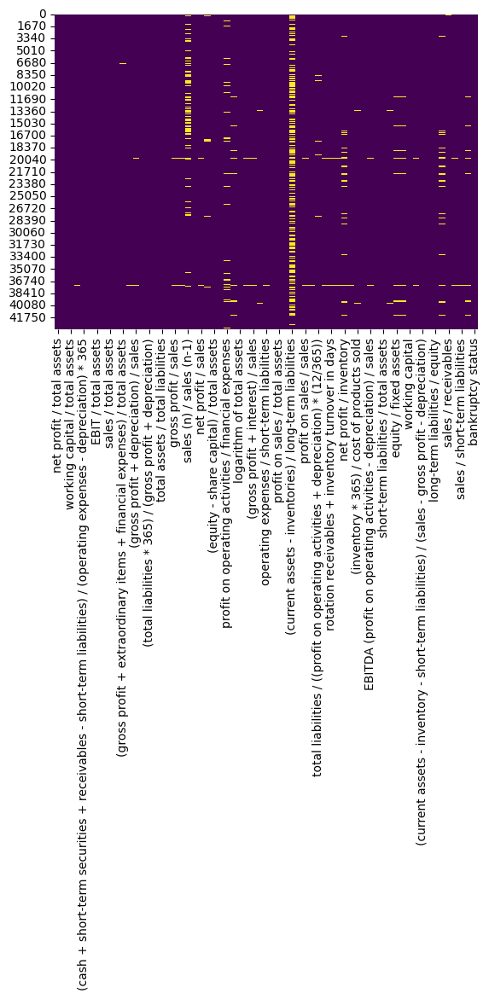

In [70]:
sns.heatmap(all_data_reset.isnull(),cbar=False,cmap='viridis')

In [71]:
all_data_reset

,net profit / total assets,total liabilities / total assets,working capital / total assets,current assets / short-term liabilities,(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365,retained earnings / total assets,EBIT / total assets,book value of equity / total liabilities,sales / total assets,equity / total assets,...,(sales - cost of products sold) / sales,(current assets - inventory - short-term liabilities) / (sales - gross profit - depreciation),total costs / total sales,long-term liabilities / equity,sales / inventory,sales / receivables,(short-term liabilities * 365) / sales,sales / short-term liabilities,sales / fixed assets,bankruptcy status
0,0.20055,0.37951,0.39641,2.0472,32.351,0.38825,0.24976,1.3305,1.1389,0.50494,...,0.12196,0.39718,0.87804,0.001924,8.416,5.1372,82.658,4.4158,7.4277,0
1,0.20912,0.49988,0.47225,1.9447,14.786,0,0.25834,0.99601,1.6996,0.49788,...,0.1213,0.42002,0.853,0,4.1486,3.2732,107.35,3.4,60.987,0
2,0.24866,0.69592,0.26713,1.5548,-1.1523,0,0.30906,0.43695,1.309,0.30408,...,0.24114,0.81774,0.76599,0.69484,4.9909,3.951,134.27,2.7185,5.2078,0
3,0.081483,0.30734,0.45879,2.4928,51.952,0.14988,0.092704,1.8661,1.0571,0.57353,...,0.054015,0.14207,0.94598,0,4.5746,3.6147,86.435,4.2228,5.5497,0
4,0.18732,0.61323,0.2296,1.4063,-7.3128,0.18732,0.18732,0.6307,1.1559,0.38677,...,0.13485,0.48431,0.86515,0.12444,6.3985,4.3158,127.21,2.8692,7.898,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43400,0.012898,0.70621,0.038857,1.1722,-18.907,0,0.013981,0.416,1.6768,0.29379,...,0.020169,0.043904,1.0122,1.2594,13.472,12.432,49.117,7.4313,2.2799,1
43401,-0.57805,0.96702,-0.80085,0.16576,-67.365,-0.57805,-0.57805,-0.40334,0.93979,-0.39004,...,-0.064073,1.482,1.0641,-0.018084,110.72,44.759,81.22,4.494,5.1305,1
43402,-0.17905,1.2553,-0.27599,0.74554,-120.44,-0.17905,-0.15493,-0.26018,1.1749,-0.32659,...,0.14888,0.54824,0.85112,-0.52243,9.8526,3.4892,207.87,1.7559,9.9527,1
43403,-0.10886,0.74394,0.015449,1.0878,-17.003,-0.10886,-0.10918,0.12531,0.84516,0.093224,...,-0.1832,-1.1677,1.1832,6.0924,13.886,6.0769,83.122,4.3911,0.95575,1


##Handling duplicate data


In [72]:
#check if data has duplicates values
duplicates = all_data_reset.duplicated()
print(duplicates)

0        False
1        False
2        False
3        False
4        False
         ...  
43400    False
43401    False
43402    False
43403    False
43404    False
Length: 43405, dtype: bool


#####We note that duplicates do not exist


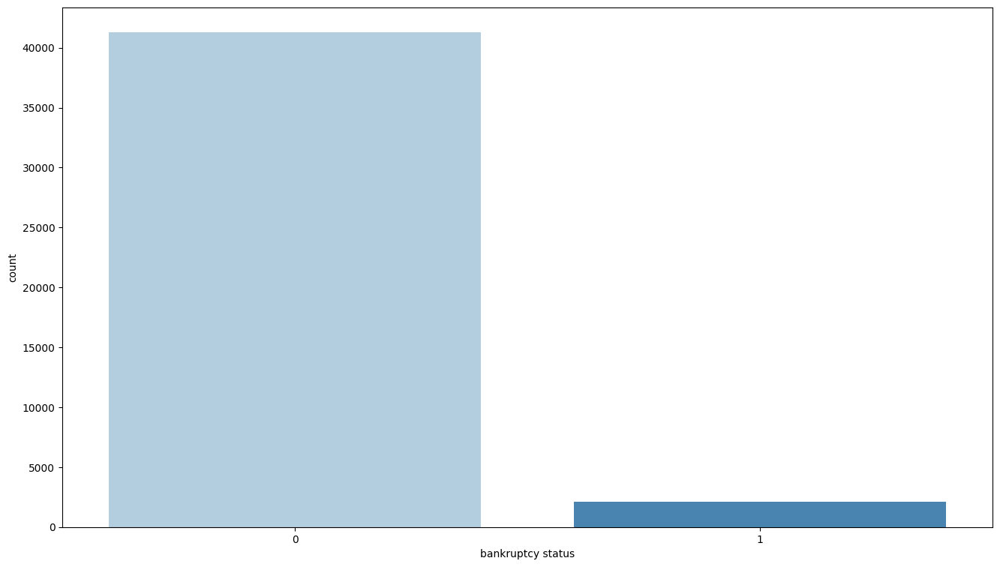

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(16,9))
sns.countplot(x ='bankruptcy status',data = all_data_reset,palette ='Blues' )
plt.show()

In [74]:
all_data_reset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43405 entries, 0 to 43404
Data columns (total 65 columns):
 #   Column                                                                                                             Non-Null Count  Dtype 
---  ------                                                                                                             --------------  ----- 
 0   net profit / total assets                                                                                          43397 non-null  object
 1   total liabilities / total assets                                                                                   43397 non-null  object
 2   working capital / total assets                                                                                     43397 non-null  object
 3   current assets / short-term liabilities                                                                            43271 non-null  object
 4   (cash + short-term securitie

In [75]:
all_data_reset.shape

(43405, 65)

#Scaling and  Normalization


In [76]:
scaler = MinMaxScaler()

# Fit and transform the entire DataFrame
data_scaled = scaler.fit_transform(all_data_reset)
# data_scaled is now a numpy array with scaled values

# Convert the numpy array back to a DataFrame with the original columns
data_scaled = pd.DataFrame(data_scaled, columns=all_data_reset.columns)
data_scaled.head()

,net profit / total assets,total liabilities / total assets,working capital / total assets,current assets / short-term liabilities,(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365,retained earnings / total assets,EBIT / total assets,book value of equity / total liabilities,sales / total assets,equity / total assets,...,(sales - cost of products sold) / sales,(current assets - inventory - short-term liabilities) / (sales - gross profit - depreciation),total costs / total sales,long-term liabilities / equity,sales / inventory,sales / receivables,(short-term liabilities * 365) / sales,sales / short-term liabilities,sales / fixed assets,bankruptcy status
0,0.831450,0.472949,0.945033,0.000046,0.904960,0.483805,0.443752,0.002664,0.000476,0.304174,...,0.999736,0.751235,0.00018,0.013563,0.000004,0.000165,0.085425,0.000254,0.034980,0.0
1,0.831466,0.473081,0.945182,0.000044,0.904959,0.483436,0.443759,0.002658,0.000533,0.304169,...,0.999736,0.751246,0.00018,0.013563,0.000003,0.000147,0.085426,0.000211,0.035155,0.0
2,0.831536,0.473296,0.944778,0.000037,0.904958,0.483436,0.443803,0.002648,0.000493,0.304046,...,0.999736,0.751425,0.00018,0.013592,0.000004,0.000154,0.085427,0.000182,0.034972,0.0
3,0.831237,0.472870,0.945156,0.000054,0.904962,0.483578,0.443617,0.002674,0.000467,0.304217,...,0.999736,0.751120,0.00018,0.013563,0.000004,0.000151,0.085425,0.000246,0.034973,0.0
4,0.831426,0.473206,0.944705,0.000034,0.904957,0.483614,0.443698,0.002651,0.000477,0.304099,...,0.999736,0.751274,0.00018,0.013568,0.000004,0.000157,0.085426,0.000188,0.034981,0.0


In [77]:
formula= [
    "net profit / total assets",
    "total liabilities / total assets",
    "working capital / total assets",
    "current assets / short-term liabilities",
    "(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365",
    "retained earnings / total assets",
    "EBIT / total assets",
    "book value of equity / total liabilities",
    "sales / total assets",
    "equity / total assets",
    "(gross profit + extraordinary items + financial expenses) / total assets",
    "gross profit / short-term liabilities",
    "(gross profit + depreciation) / sales",
    "(gross profit + interest) / total assets",
    "(total liabilities * 365) / (gross profit + depreciation)",
    "(gross profit + depreciation) / total liabilities",
    "total assets / total liabilities",
    "gross profit / total assets",
    "gross profit / sales",
    "(inventory * 365) / sales",
    "sales (n) / sales (n-1)",
    "profit on operating activities / total assets",
    "net profit / sales",
    "gross profit (in 3 years) / total assets",
    "(equity - share capital) / total assets",
    "(net profit + depreciation) / total liabilities",
    "profit on operating activities / financial expenses",
    "working capital / fixed assets",
    "logarithm of total assets",
    "(total liabilities - cash) / sales",
    "(gross profit + interest) / sales",
    "(current liabilities * 365) / cost of products sold",
    "operating expenses / short-term liabilities",
    "operating expenses / total liabilities",
    "profit on sales / total assets",
    "total sales / total assets",
    "(current assets - inventories) / long-term liabilities",
    "constant capital / total assets",
    "profit on sales / sales",
    "(current assets - inventory - receivables) / short-term liabilities",
    "total liabilities / ((profit on operating activities + depreciation) * (12/365))",
    "profit on operating activities / sales",
    "rotation receivables + inventory turnover in days",
    "(receivables * 365) / sales",
    "net profit / inventory",
    "(current assets - inventory) / short-term liabilities",
    "(inventory * 365) / cost of products sold",
    "EBITDA (profit on operating activities - depreciation) / total assets",
    "EBITDA (profit on operating activities - depreciation) / sales",
    "current assets / total liabilities",
    "short-term liabilities / total assets",
    "(short-term liabilities * 365) / cost of products sold",
    "equity / fixed assets",
    "constant capital / fixed assets",
    "working capital",
    "(sales - cost of products sold) / sales",
    "(current assets - inventory - short-term liabilities) / (sales - gross profit - depreciation)",
    "total costs / total sales",
    "long-term liabilities / equity",
    "sales / inventory",
    "sales / receivables",
    "(short-term liabilities * 365) / sales",
    "sales / short-term liabilities",
    "sales / fixed assets",
    "bankruptcy status",
]

In [78]:
for col in formula:
    all_data_reset[col]=pd.to_numeric(all_data_reset[col])
    all_data_reset[col].fillna(all_data_reset[col].mean(), inplace=True)
all_data_reset.head()

,net profit / total assets,total liabilities / total assets,working capital / total assets,current assets / short-term liabilities,(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365,retained earnings / total assets,EBIT / total assets,book value of equity / total liabilities,sales / total assets,equity / total assets,...,(sales - cost of products sold) / sales,(current assets - inventory - short-term liabilities) / (sales - gross profit - depreciation),total costs / total sales,long-term liabilities / equity,sales / inventory,sales / receivables,(short-term liabilities * 365) / sales,sales / short-term liabilities,sales / fixed assets,bankruptcy status
0,0.200550,0.37951,0.39641,2.0472,32.3510,0.38825,0.249760,1.33050,1.1389,0.50494,...,0.121960,0.39718,0.87804,0.001924,8.4160,5.1372,82.658,4.4158,7.4277,0
1,0.209120,0.49988,0.47225,1.9447,14.7860,0.00000,0.258340,0.99601,1.6996,0.49788,...,0.121300,0.42002,0.85300,0.000000,4.1486,3.2732,107.350,3.4000,60.9870,0
2,0.248660,0.69592,0.26713,1.5548,-1.1523,0.00000,0.309060,0.43695,1.3090,0.30408,...,0.241140,0.81774,0.76599,0.694840,4.9909,3.9510,134.270,2.7185,5.2078,0
3,0.081483,0.30734,0.45879,2.4928,51.9520,0.14988,0.092704,1.86610,1.0571,0.57353,...,0.054015,0.14207,0.94598,0.000000,4.5746,3.6147,86.435,4.2228,5.5497,0
4,0.187320,0.61323,0.22960,1.4063,-7.3128,0.18732,0.187320,0.63070,1.1559,0.38677,...,0.134850,0.48431,0.86515,0.124440,6.3985,4.3158,127.210,2.8692,7.8980,0


#Exploratory Data Analysis


##Univariate analysis

In [79]:
display(all_data_reset.describe().round(2))

,net profit / total assets,total liabilities / total assets,working capital / total assets,current assets / short-term liabilities,(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365,retained earnings / total assets,EBIT / total assets,book value of equity / total liabilities,sales / total assets,equity / total assets,...,(sales - cost of products sold) / sales,(current assets - inventory - short-term liabilities) / (sales - gross profit - depreciation),total costs / total sales,long-term liabilities / equity,sales / inventory,sales / receivables,(short-term liabilities * 365) / sales,sales / short-term liabilities,sales / fixed assets,bankruptcy status
count,43405.00,43405.00,43405.00,43405.00,43405.00,43405.00,43405.00,43405.00,43405.00,43405.00,...,43405.00,43405.00,43405.00,43405.00,43405.00,43405.00,43405.00,43405.00,43405.00,43405.00
mean,0.04,0.59,0.11,6.31,-385.35,-0.06,0.09,12.64,2.65,0.63,...,-26.22,-0.01,30.03,1.33,448.09,17.03,1502.33,9.34,72.79,0.05
std,2.99,5.84,5.44,294.98,61180.20,7.20,5.71,505.35,62.93,14.67,...,5320.06,13.67,5329.29,122.09,31533.55,552.40,139062.80,123.99,2347.07,0.21
min,-463.89,-430.87,-479.96,-0.40,-11903000.00,-508.41,-517.48,-141.41,-3.50,-479.91,...,-1108300.00,-1667.30,-198.69,-327.97,-12.44,-12.66,-2336500.00,-1.54,-10677.00,0.00
25%,0.00,0.27,0.02,1.05,-49.49,0.00,0.01,0.43,1.02,0.30,...,0.01,0.01,0.88,0.00,5.73,4.52,42.20,3.10,2.21,0.00
50%,0.05,0.47,0.20,1.57,-1.18,0.00,0.06,1.07,1.20,0.51,...,0.05,0.12,0.95,0.01,10.40,6.65,71.54,5.10,4.39,0.00
75%,0.13,0.69,0.40,2.81,50.46,0.09,0.15,2.64,2.06,0.71,...,0.13,0.28,0.99,0.24,23.89,10.44,117.74,8.65,10.46,0.00
max,94.28,480.96,28.34,53433.00,1250100.00,543.25,649.23,53432.00,9742.30,1099.50,...,293.15,552.64,1108300.00,23853.00,4818700.00,108000.00,25016000.00,23454.00,294770.00,1.00


In [80]:
def univariate_analysis(data_set,feature_column):
  feature_data=data_set[feature_column]
  plt.hist(feature_data, bins=20, edgecolor='black')
  plt.title(f'Histogram of {feature_column}')
  plt.xlabel(feature_column)
  plt.ylabel('Frequency')
  plt.show()
  print("\n")
  sns.boxplot(x=feature_data)
  plt.title(f'Box Plot of {feature_column}')
  plt.xlabel(feature_column)
  plt.show()
  print("\n")
  skewness = feature_data.skew()
  kurtosis = feature_data.kurtosis()
  summary_stats = feature_data.describe()
  print(summary_stats)





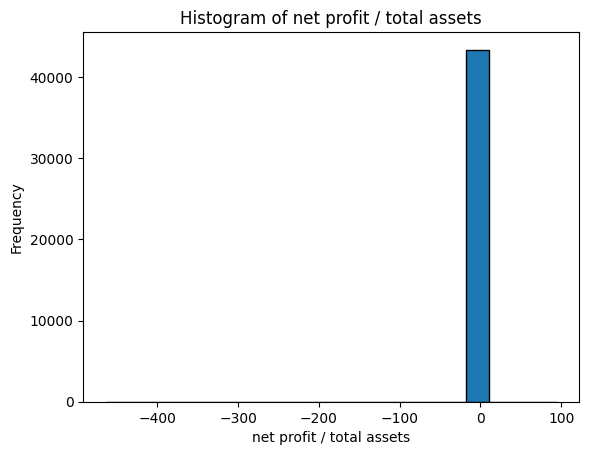

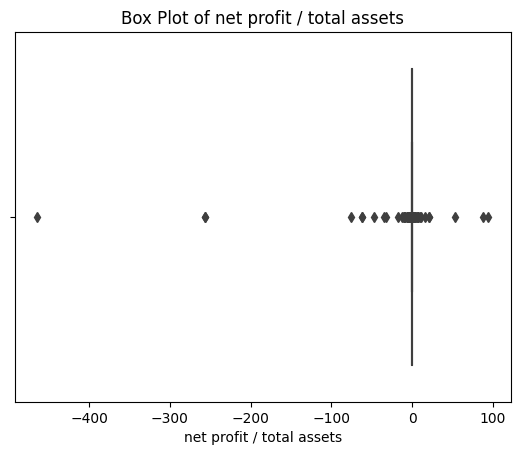



count    43405.000000
mean         0.035160
std          2.993833
min       -463.890000
25%          0.003434
50%          0.049636
75%          0.129560
max         94.280000
Name: net profit / total assets, dtype: float64


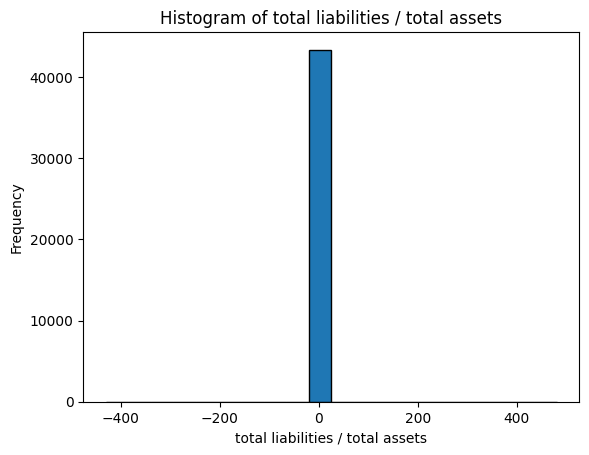

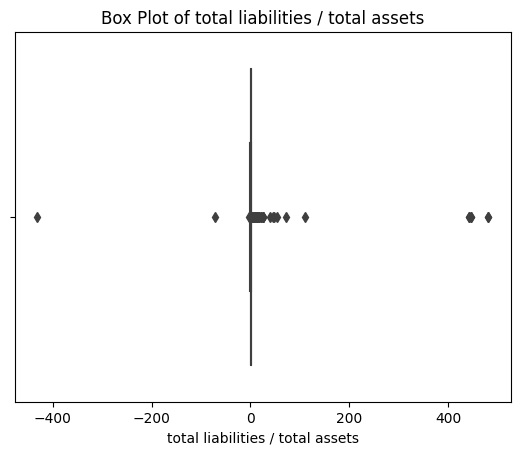



count    43405.000000
mean         0.590212
std          5.842209
min       -430.870000
25%          0.269010
50%          0.471940
75%          0.688270
max        480.960000
Name: total liabilities / total assets, dtype: float64


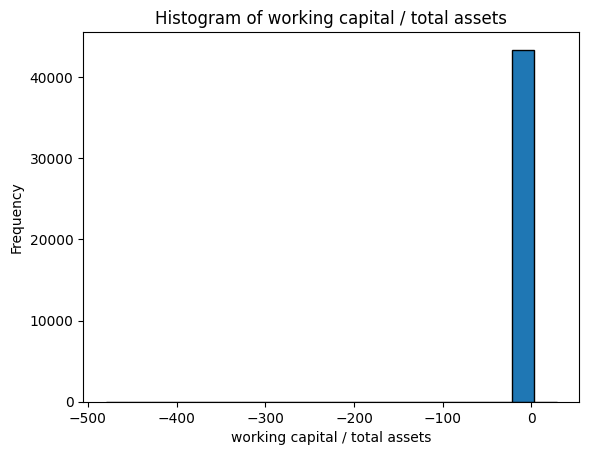

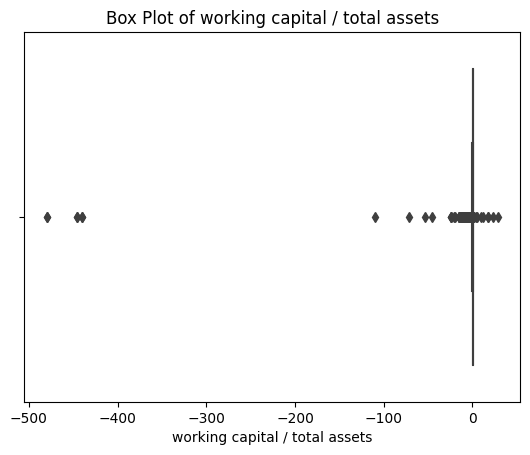



count    43405.000000
mean         0.114431
std          5.438928
min       -479.960000
25%          0.021540
50%          0.196580
75%          0.403260
max         28.336000
Name: working capital / total assets, dtype: float64


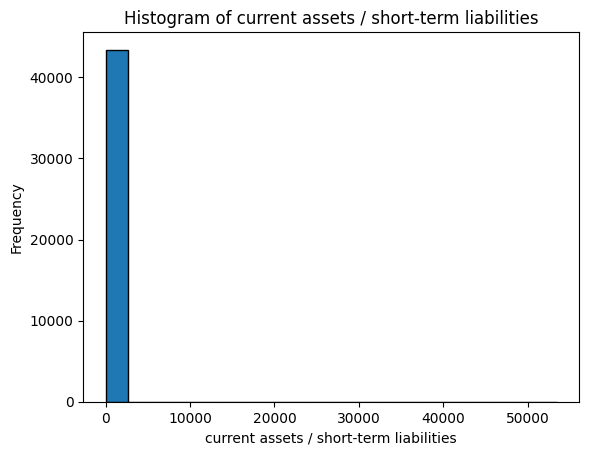

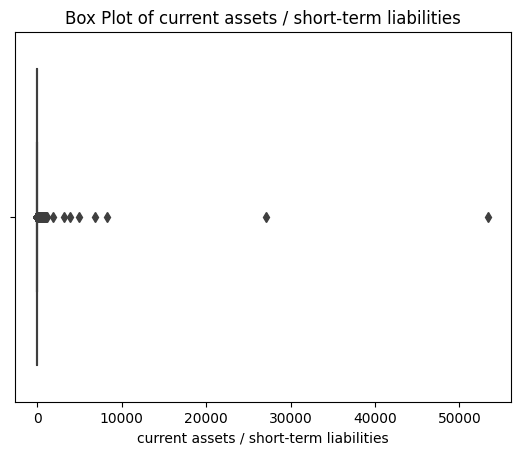



count    43405.000000
mean         6.314702
std        294.978029
min         -0.403110
25%          1.050800
50%          1.574000
75%          2.806000
max      53433.000000
Name: current assets / short-term liabilities, dtype: float64


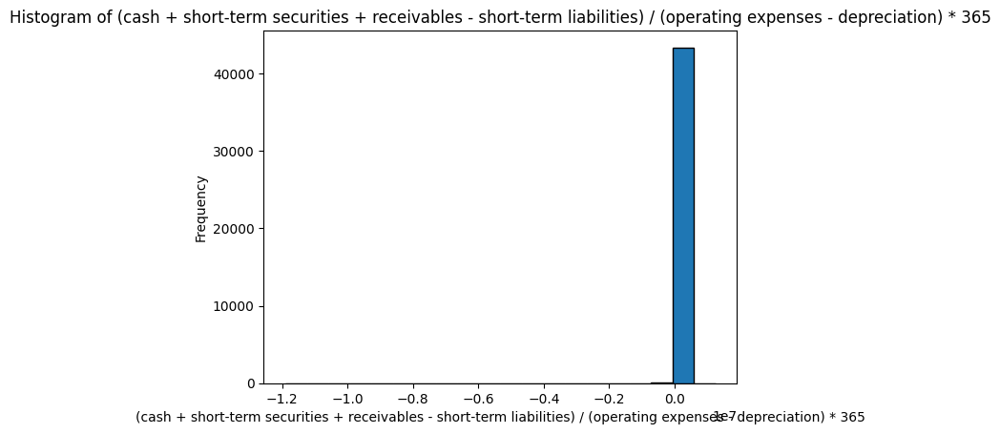

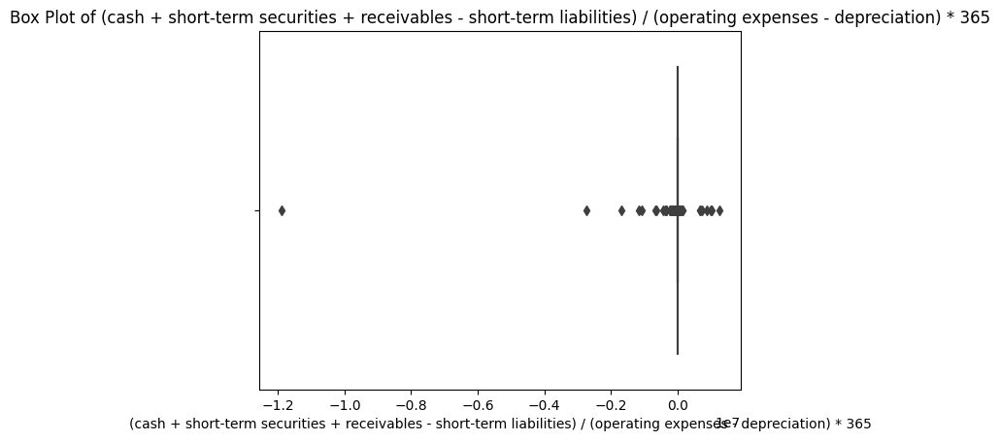



count    4.340500e+04
mean    -3.853466e+02
std      6.118020e+04
min     -1.190300e+07
25%     -4.949000e+01
50%     -1.184000e+00
75%      5.046100e+01
max      1.250100e+06
Name: (cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365, dtype: float64


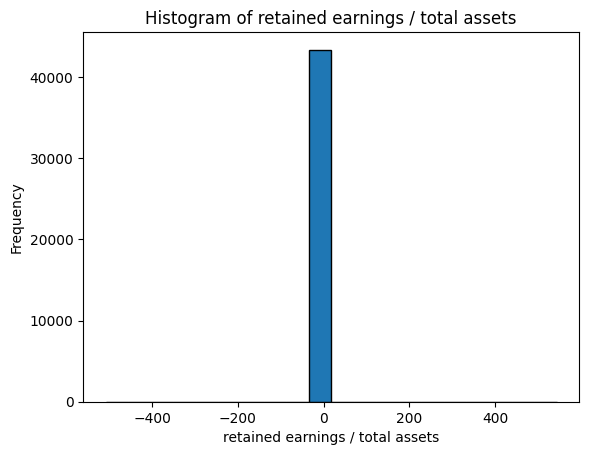

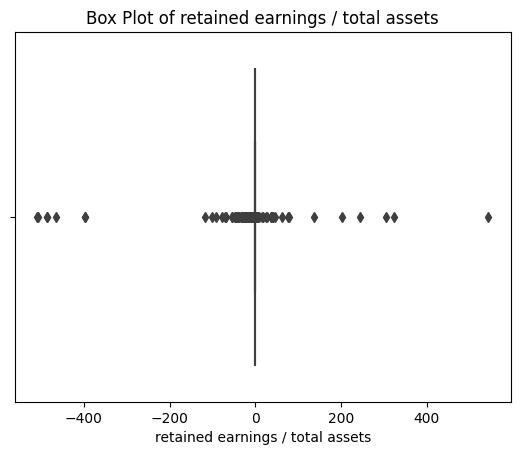



count    43405.000000
mean        -0.056107
std          7.200663
min       -508.410000
25%          0.000000
50%          0.000000
75%          0.089441
max        543.250000
Name: retained earnings / total assets, dtype: float64


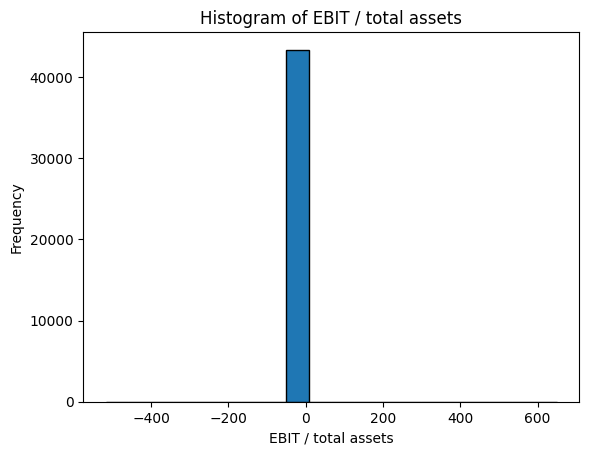

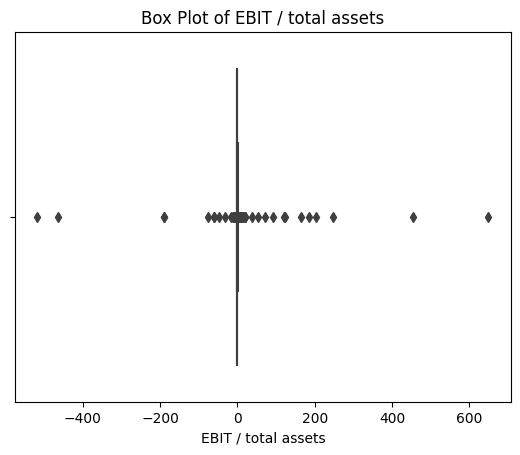



count    43405.000000
mean         0.093478
std          5.712548
min       -517.480000
25%          0.005783
50%          0.059653
75%          0.150810
max        649.230000
Name: EBIT / total assets, dtype: float64


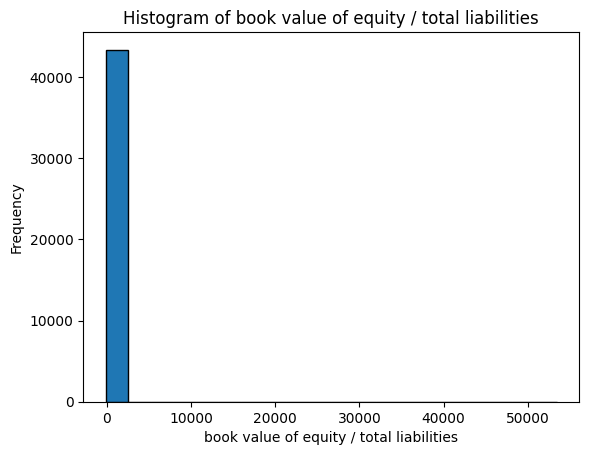

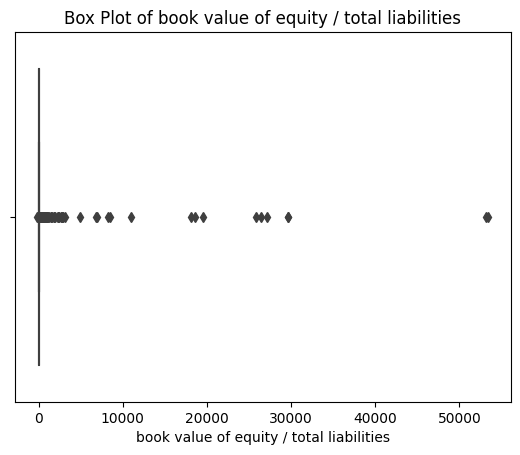



count    43405.000000
mean        12.640779
std        505.346176
min       -141.410000
25%          0.431070
50%          1.074100
75%          2.639100
max      53432.000000
Name: book value of equity / total liabilities, dtype: float64


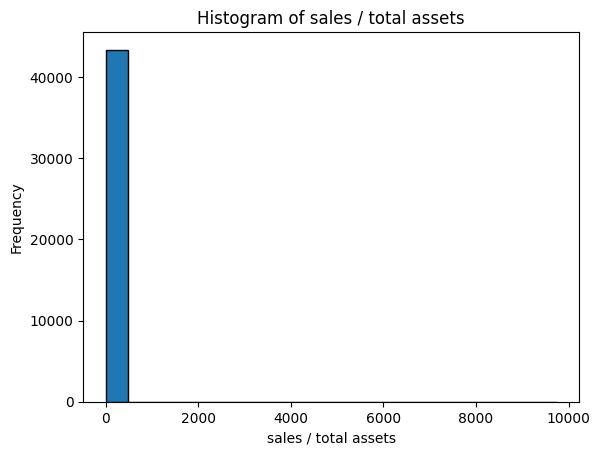

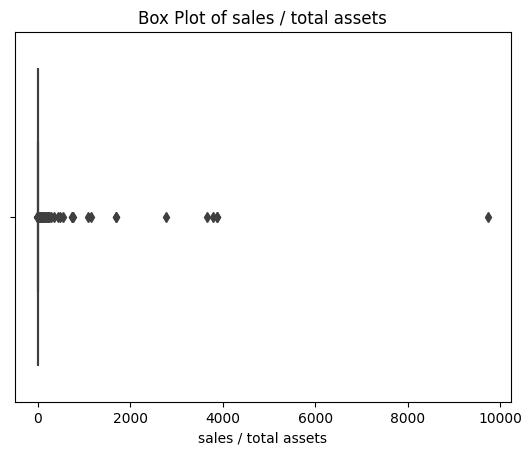



count    43405.000000
mean         2.652166
std         62.926207
min         -3.496000
25%          1.018500
50%          1.195500
75%          2.063000
max       9742.300000
Name: sales / total assets, dtype: float64


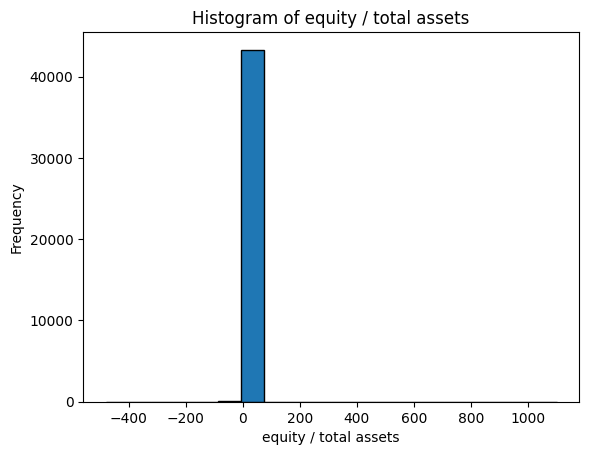

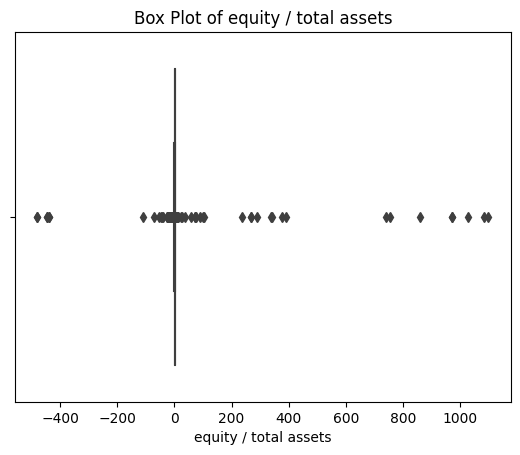



count    43405.000000
mean         0.626868
std         14.669245
min       -479.910000
25%          0.295530
50%          0.505990
75%          0.709090
max       1099.500000
Name: equity / total assets, dtype: float64


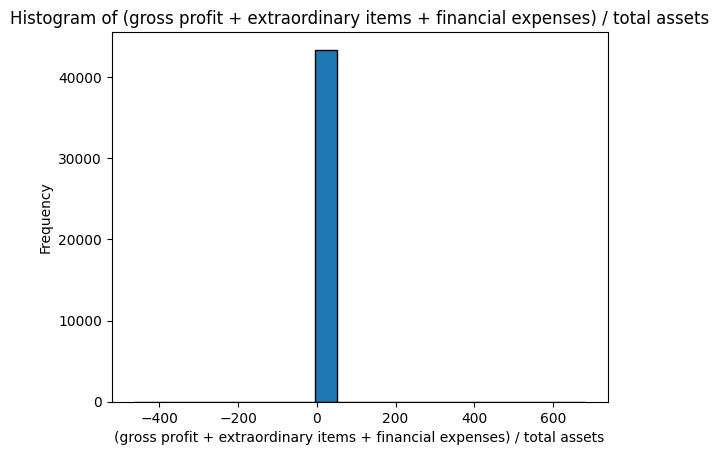

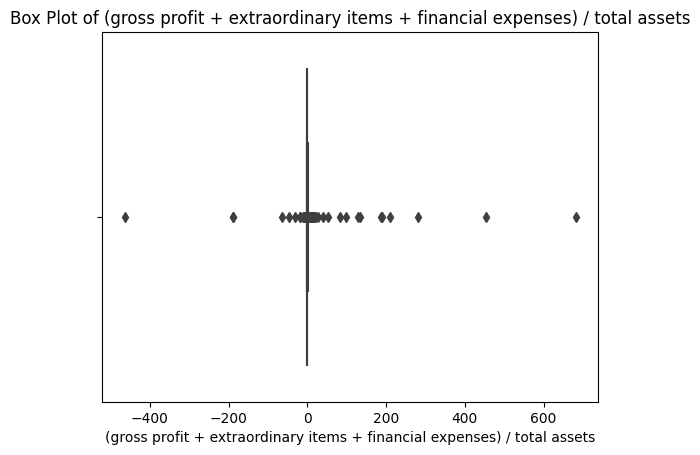



count    43405.000000
mean         0.131075
std          5.304091
min       -463.890000
25%          0.015466
50%          0.075444
75%          0.166590
max        681.540000
Name: (gross profit + extraordinary items + financial expenses) / total assets, dtype: float64


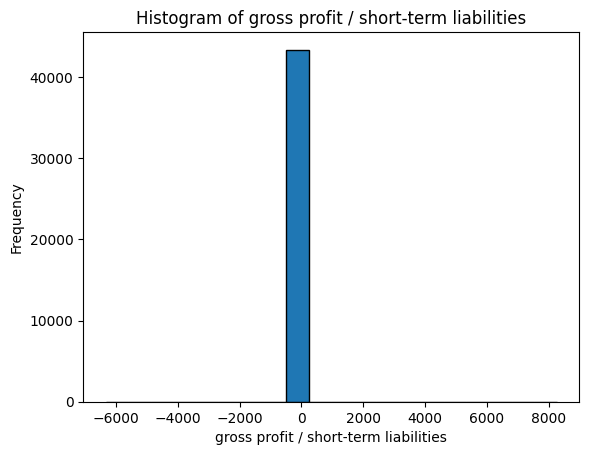

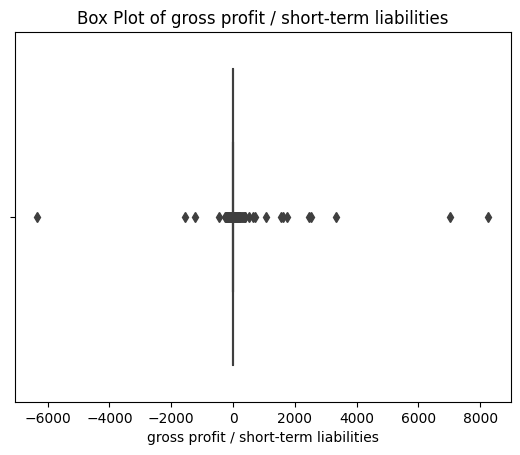



count    43405.000000
mean         1.132430
std         67.485881
min      -6331.800000
25%          0.015294
50%          0.173830
75%          0.593420
max       8259.400000
Name: gross profit / short-term liabilities, dtype: float64


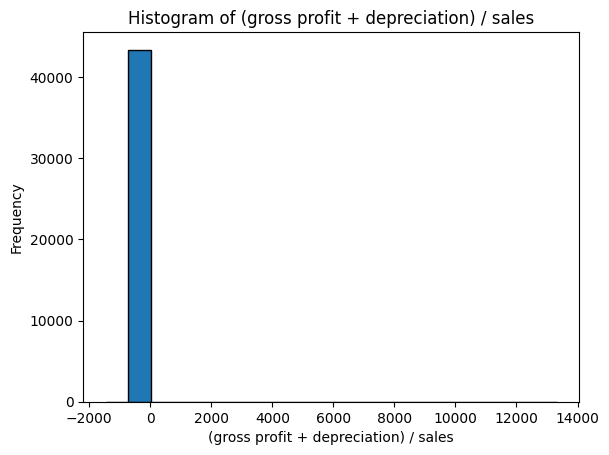

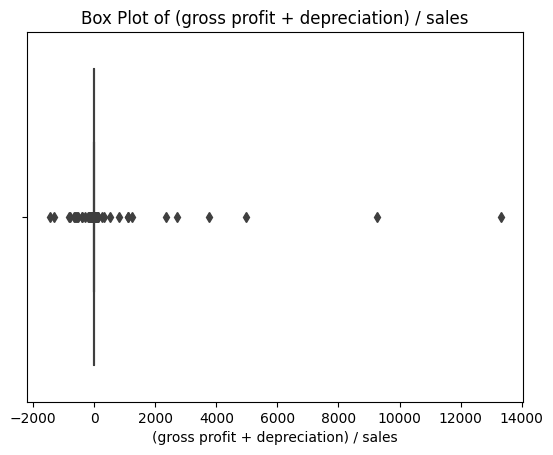



count    43405.000000
mean         0.809544
std         86.816761
min      -1460.600000
25%          0.023998
50%          0.068794
75%          0.135830
max      13315.000000
Name: (gross profit + depreciation) / sales, dtype: float64


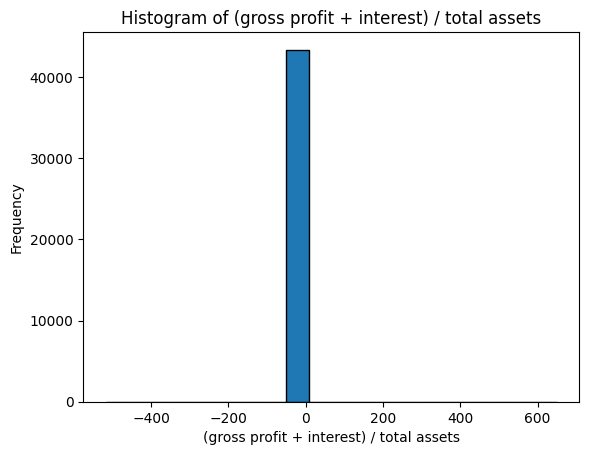

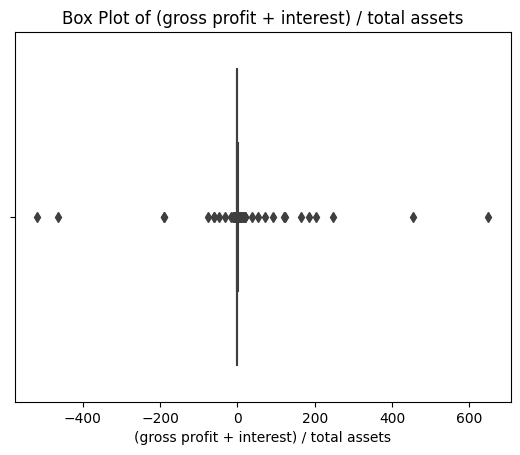



count    43405.000000
mean         0.093489
std          5.712548
min       -517.480000
25%          0.005795
50%          0.059665
75%          0.150830
max        649.230000
Name: (gross profit + interest) / total assets, dtype: float64


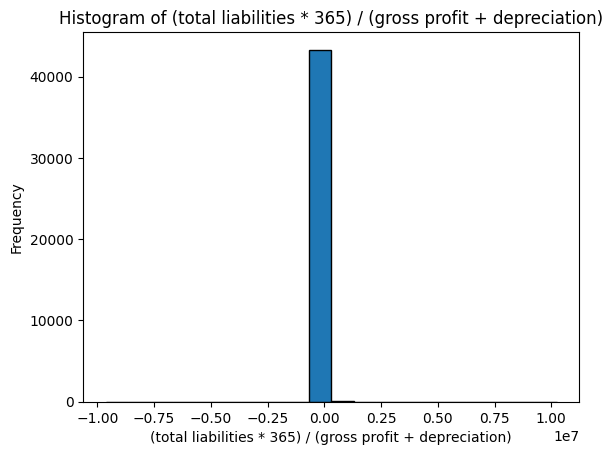

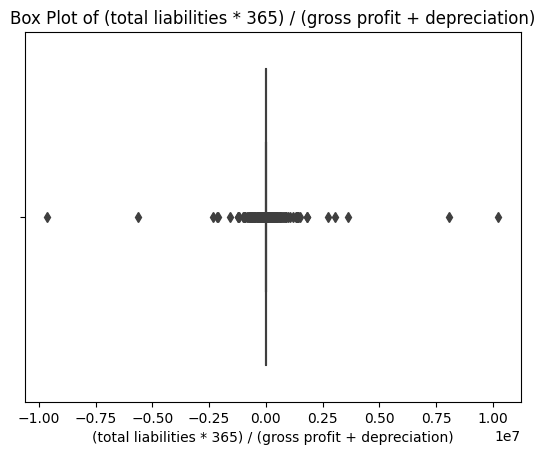



count    4.340500e+04
mean     1.991890e+03
std      9.639193e+04
min     -9.632400e+06
25%      2.231800e+02
50%      8.471100e+02
75%      2.224800e+03
max      1.023600e+07
Name: (total liabilities * 365) / (gross profit + depreciation), dtype: float64


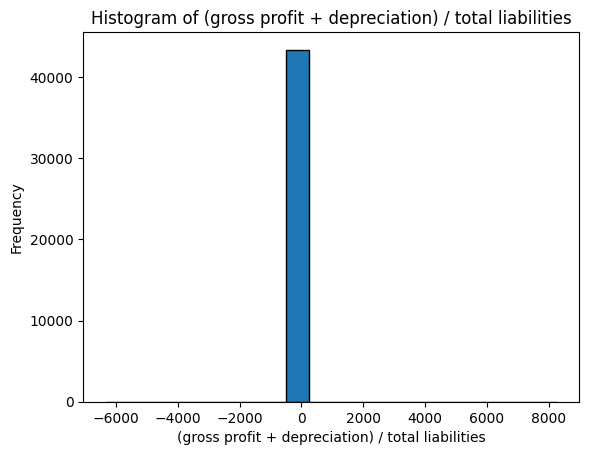

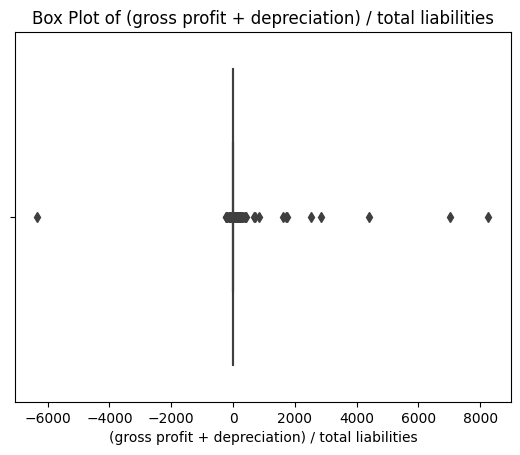



count    43405.000000
mean         1.411167
std         68.444971
min      -6331.800000
25%          0.073787
50%          0.246780
75%          0.669140
max       8259.400000
Name: (gross profit + depreciation) / total liabilities, dtype: float64


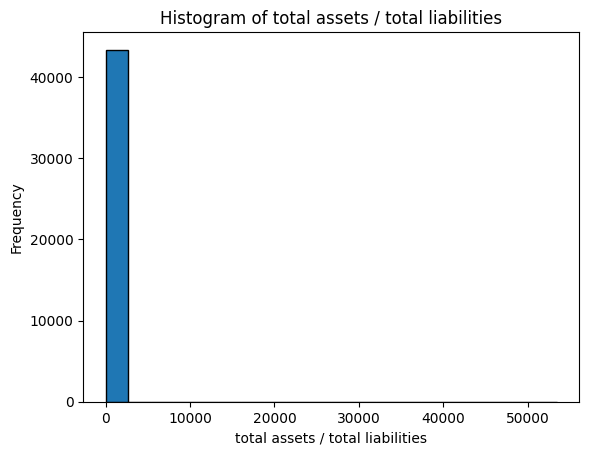

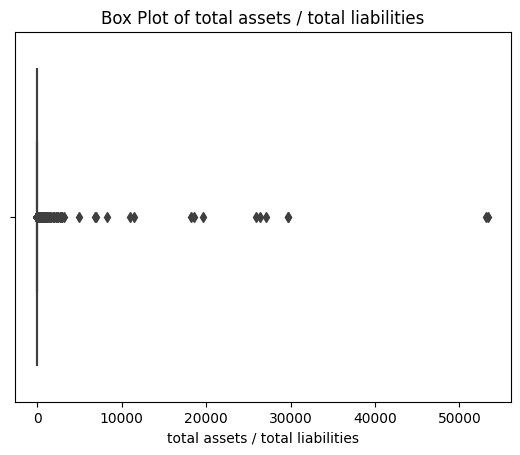



count    43405.000000
mean        13.802535
std        506.772450
min         -0.412920
25%          1.452400
50%          2.119000
75%          3.717800
max      53433.000000
Name: total assets / total liabilities, dtype: float64


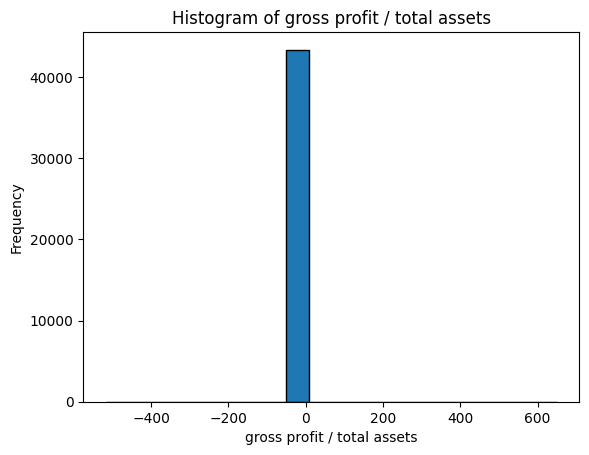

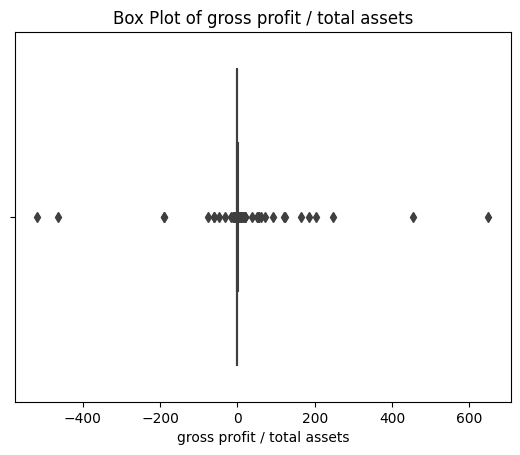



count    43405.000000
mean         0.098565
std          5.737116
min       -517.480000
25%          0.005795
50%          0.059665
75%          0.150880
max        649.230000
Name: gross profit / total assets, dtype: float64


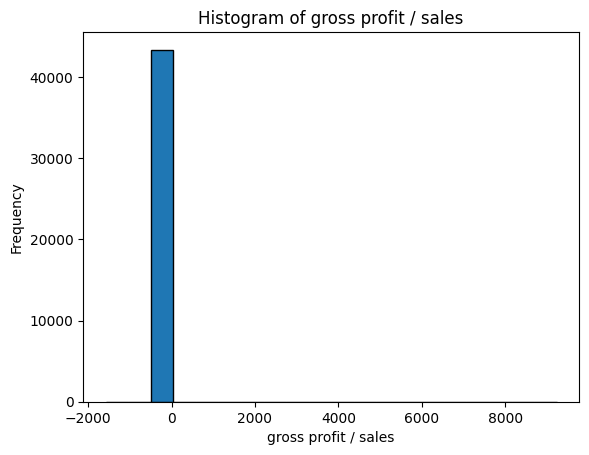

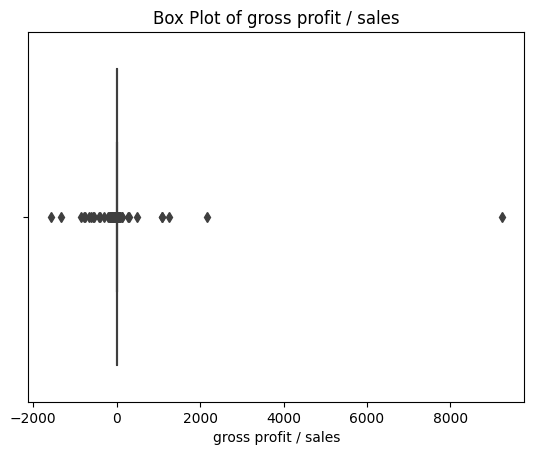



count    43405.000000
mean         0.156277
std         48.620304
min      -1578.700000
25%          0.003947
50%          0.036180
75%          0.091700
max       9230.500000
Name: gross profit / sales, dtype: float64


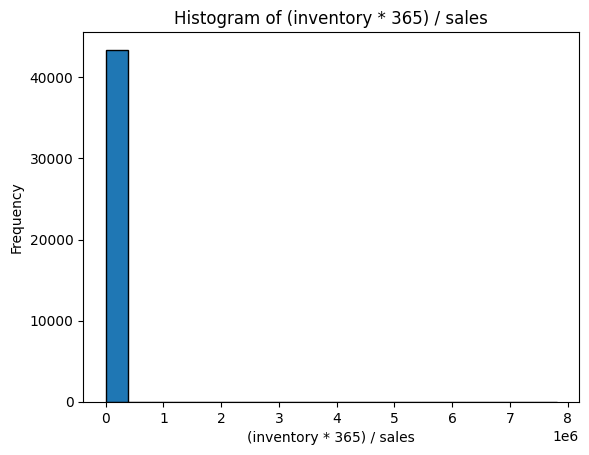

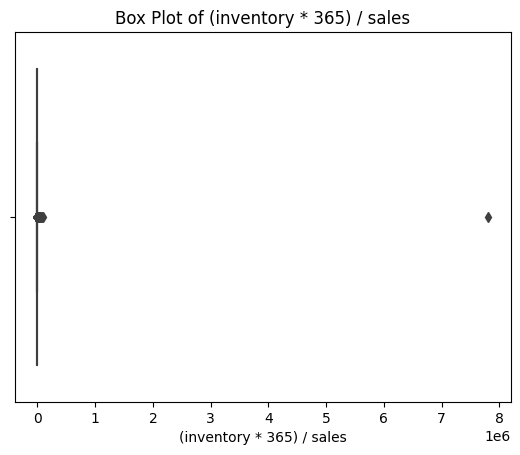



count    4.340500e+04
mean     2.430209e+02
std      3.749021e+04
min     -2.934000e+01
25%      1.544900e+01
50%      3.528400e+01
75%      6.407300e+01
max      7.809200e+06
Name: (inventory * 365) / sales, dtype: float64


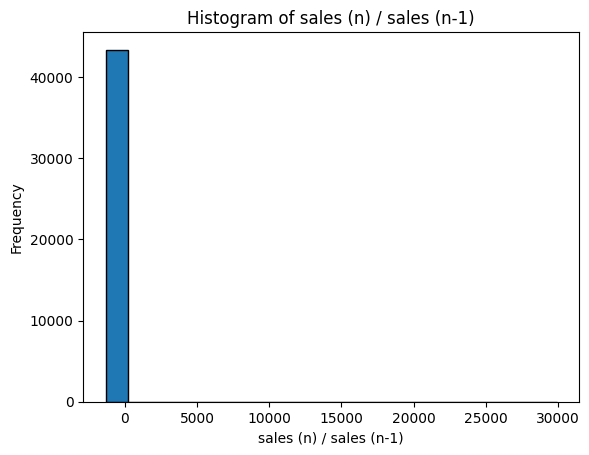

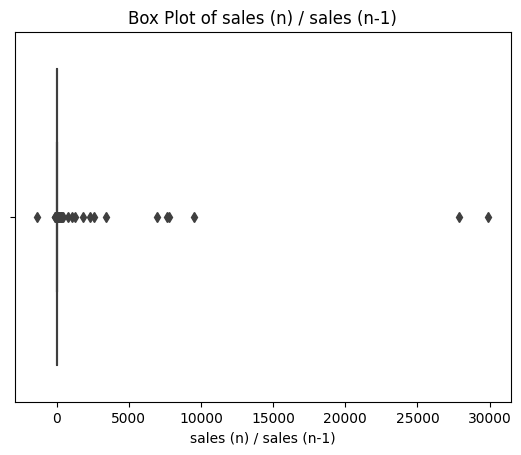



count    43405.000000
mean         3.884997
std        212.690090
min      -1325.000000
25%          0.934070
50%          1.086800
75%          1.346100
max      29907.000000
Name: sales (n) / sales (n-1), dtype: float64


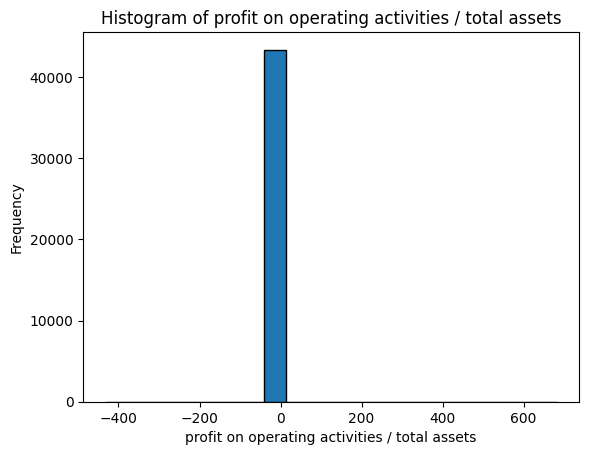

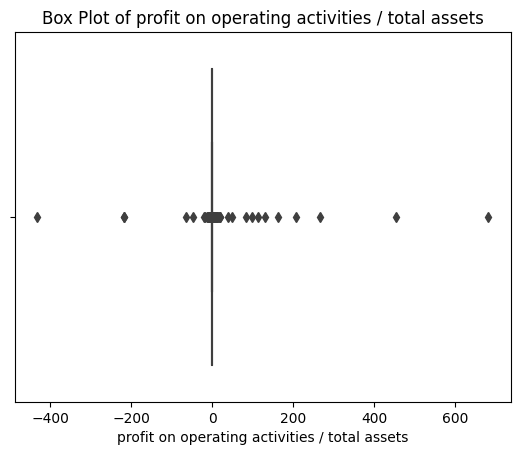



count    43405.000000
mean         0.113923
std          5.155303
min       -431.590000
25%          0.000000
50%          0.062273
75%          0.149940
max        681.540000
Name: profit on operating activities / total assets, dtype: float64


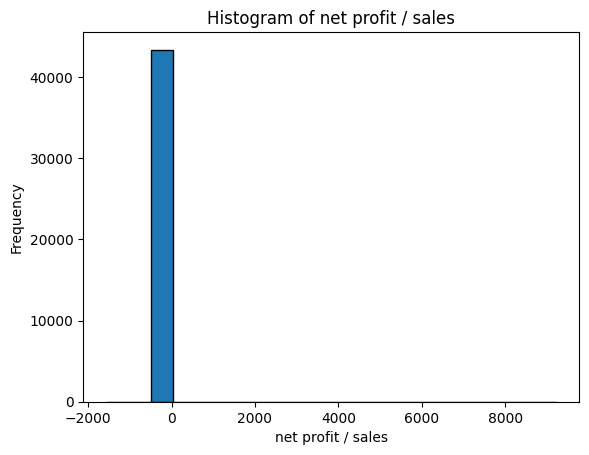

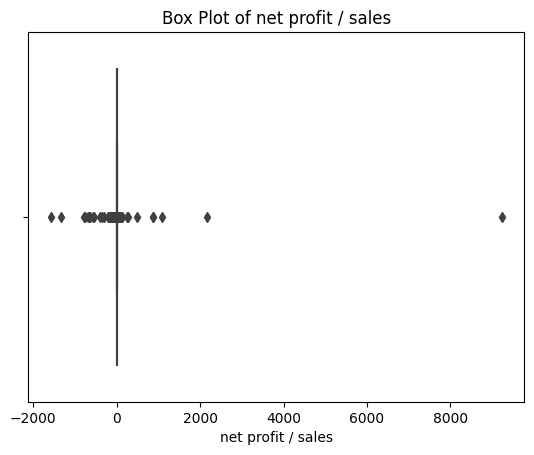



count    43405.000000
mean         0.138582
std         48.264208
min      -1578.700000
25%          0.002329
50%          0.030139
75%          0.078777
max       9230.500000
Name: net profit / sales, dtype: float64


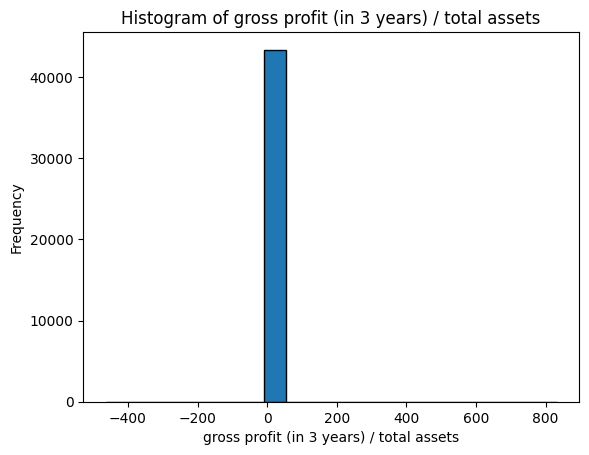

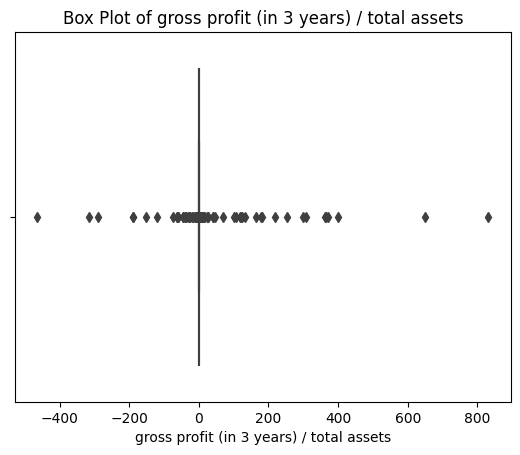



count    43405.000000
mean         0.270012
std          7.902852
min       -463.890000
25%          0.024308
50%          0.161710
75%          0.350270
max        831.660000
Name: gross profit (in 3 years) / total assets, dtype: float64


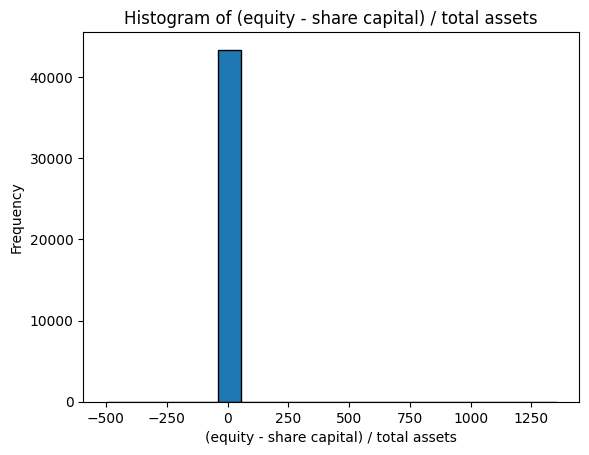

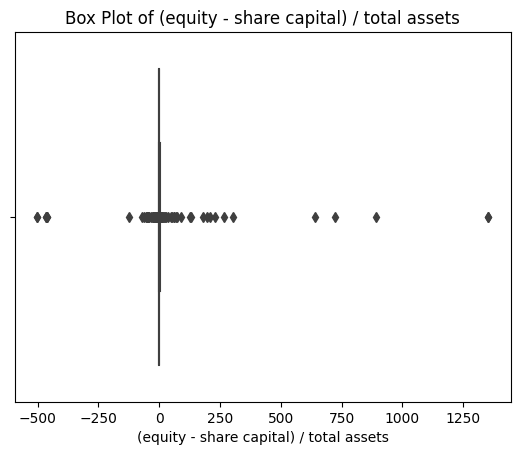



count    43405.000000
mean         0.392844
std         12.890251
min       -500.930000
25%          0.150140
50%          0.384600
75%          0.610700
max       1353.300000
Name: (equity - share capital) / total assets, dtype: float64


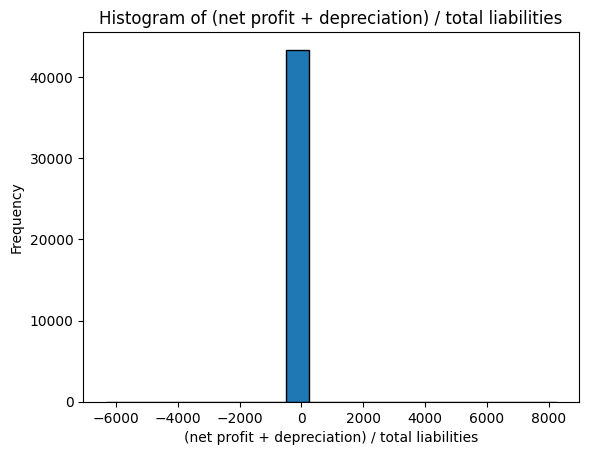

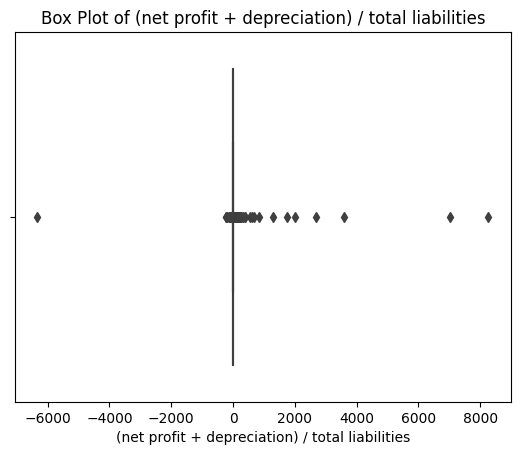



count    43405.000000
mean         1.263864
std         66.151611
min      -6331.800000
25%          0.067034
50%          0.222550
75%          0.602580
max       8262.300000
Name: (net profit + depreciation) / total liabilities, dtype: float64


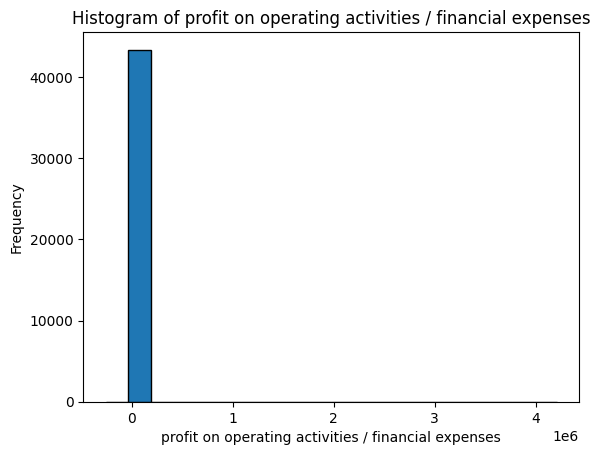

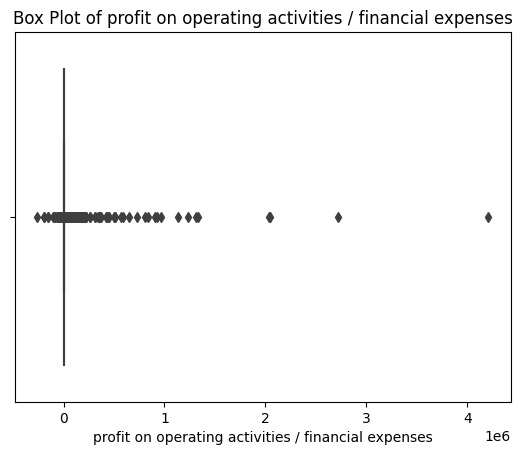



count    4.340500e+04
mean     1.107896e+03
std      3.387922e+04
min     -2.590100e+05
25%      1.062800e-01
50%      1.278200e+00
75%      8.273500e+00
max      4.208800e+06
Name: profit on operating activities / financial expenses, dtype: float64


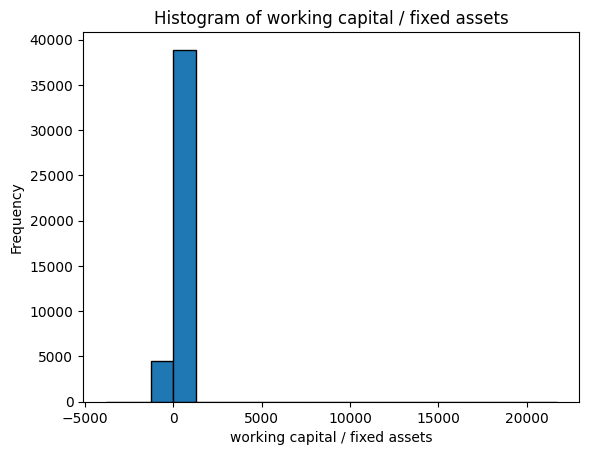

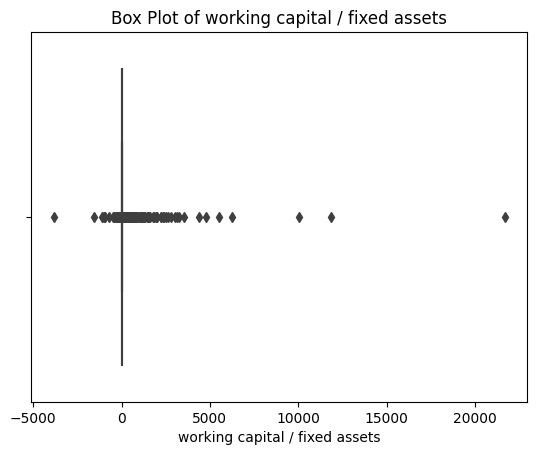



count    43405.000000
mean         6.003208
std        152.026308
min      -3829.900000
25%          0.044774
50%          0.486640
75%          1.618100
max      21701.000000
Name: working capital / fixed assets, dtype: float64


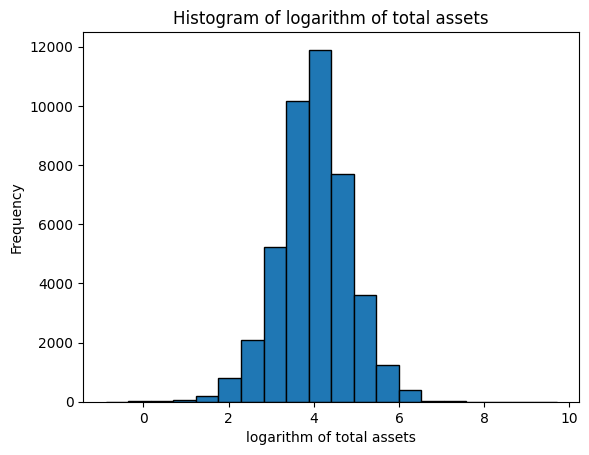

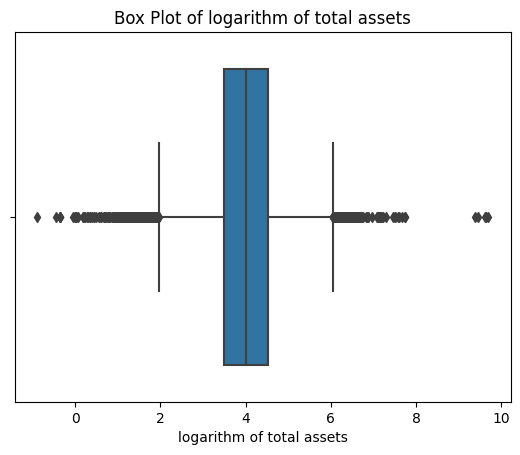



count    43405.000000
mean         4.005020
std          0.826781
min         -0.886060
25%          3.495300
50%          4.013900
75%          4.520100
max          9.698300
Name: logarithm of total assets, dtype: float64


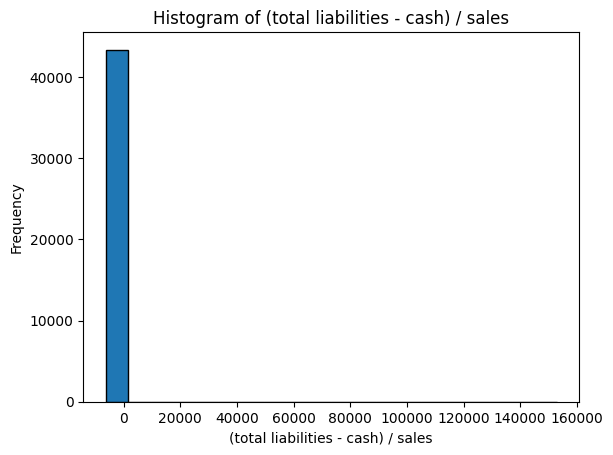

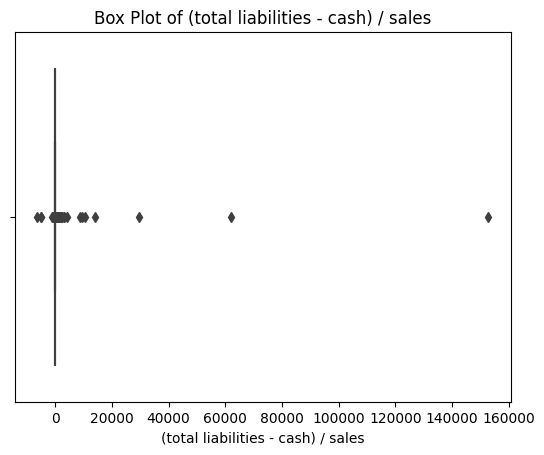



count     43405.000000
mean          7.370821
std         813.297607
min       -6351.700000
25%           0.083115
50%           0.218200
75%           0.411340
max      152860.000000
Name: (total liabilities - cash) / sales, dtype: float64


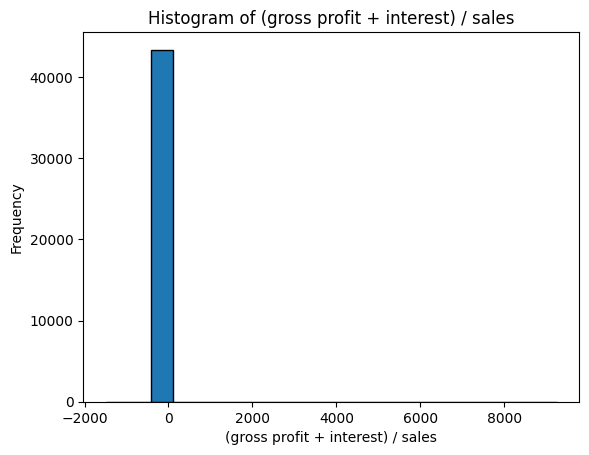

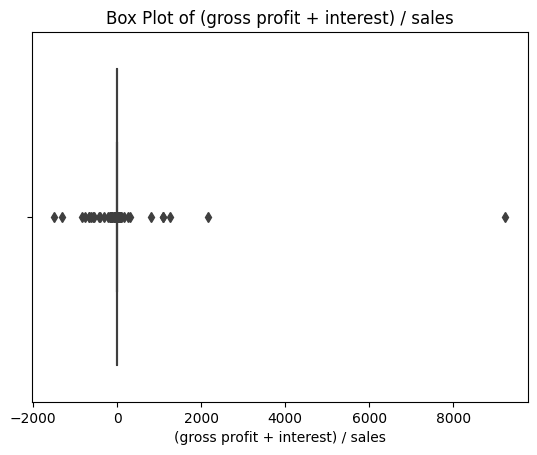



count    43405.000000
mean         0.176847
std         48.677039
min      -1495.600000
25%          0.007062
50%          0.043350
75%          0.102220
max       9244.300000
Name: (gross profit + interest) / sales, dtype: float64


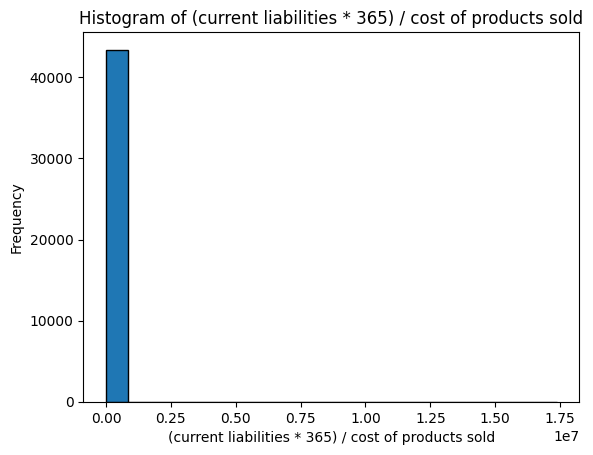

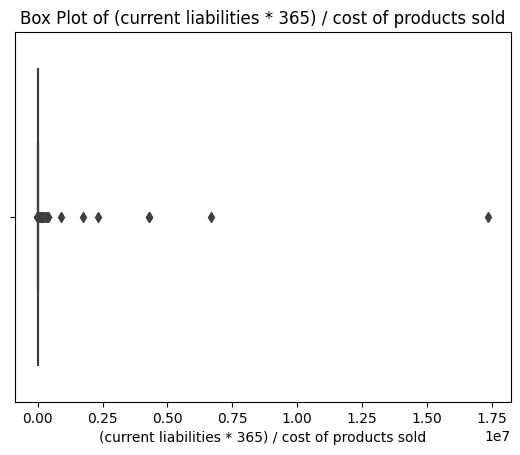



count    4.340500e+04
mean     1.162621e+03
std      9.518745e+04
min     -9.295600e+03
25%      4.664400e+01
50%      7.904200e+01
75%      1.300600e+02
max      1.736400e+07
Name: (current liabilities * 365) / cost of products sold, dtype: float64


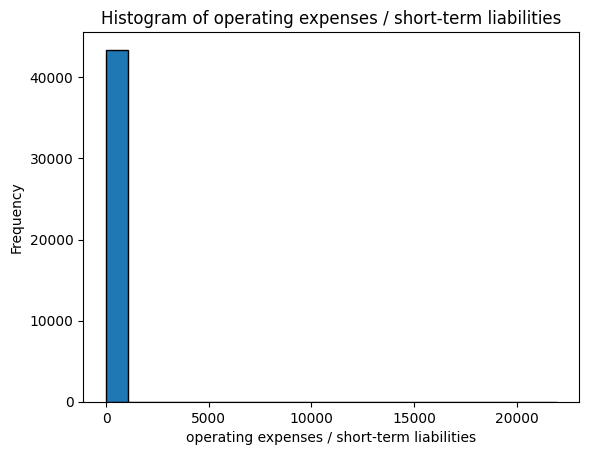

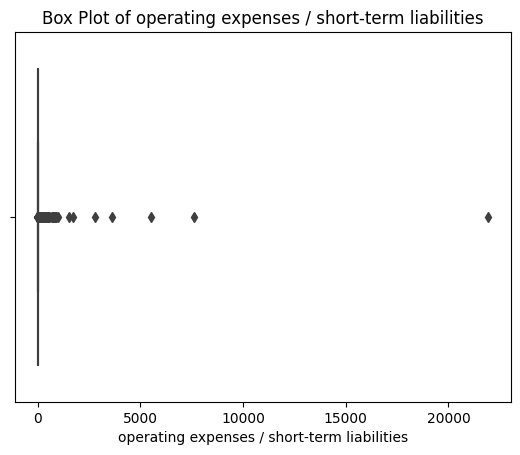



count    43405.000000
mean         8.636016
std        118.807364
min        -19.197000
25%          2.824800
50%          4.641700
75%          7.852400
max      21944.000000
Name: operating expenses / short-term liabilities, dtype: float64


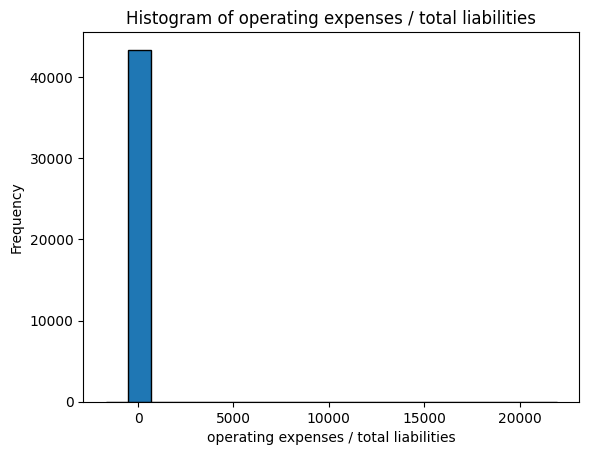

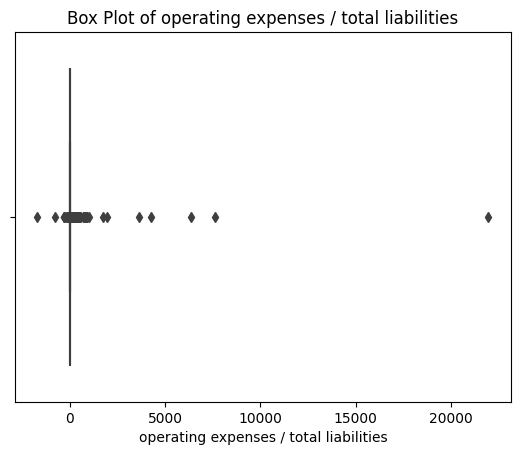



count    43405.000000
mean         5.411439
std        120.844041
min      -1696.000000
25%          0.307820
50%          1.975100
75%          4.579500
max      21944.000000
Name: operating expenses / total liabilities, dtype: float64


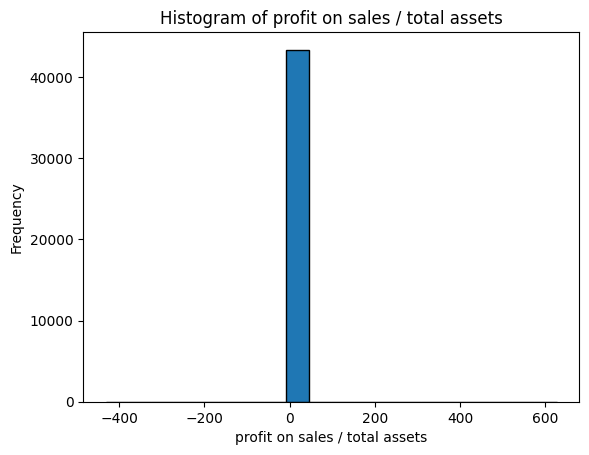

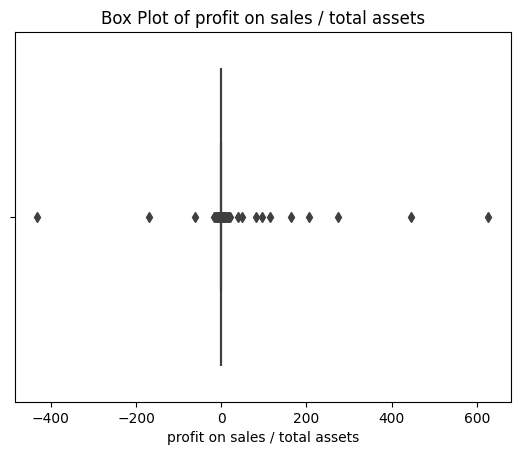



count    43405.000000
mean         0.111908
std          4.782957
min       -431.590000
25%          0.006052
50%          0.060684
75%          0.150070
max        626.920000
Name: profit on sales / total assets, dtype: float64


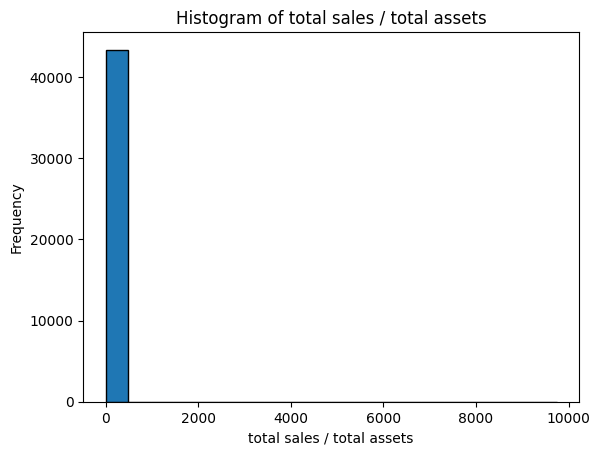

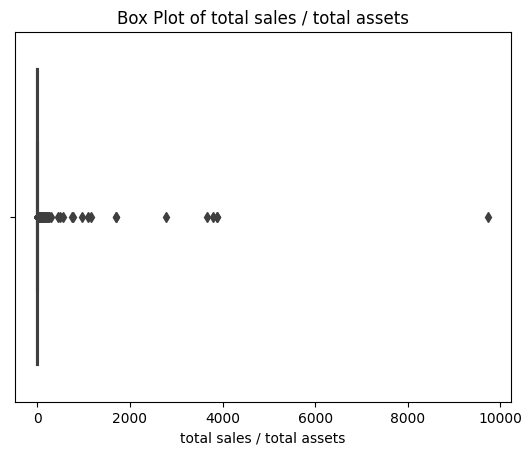



count    43405.000000
mean         2.911241
std         62.978542
min         -0.000857
25%          1.101100
50%          1.643400
75%          2.421300
max       9742.300000
Name: total sales / total assets, dtype: float64


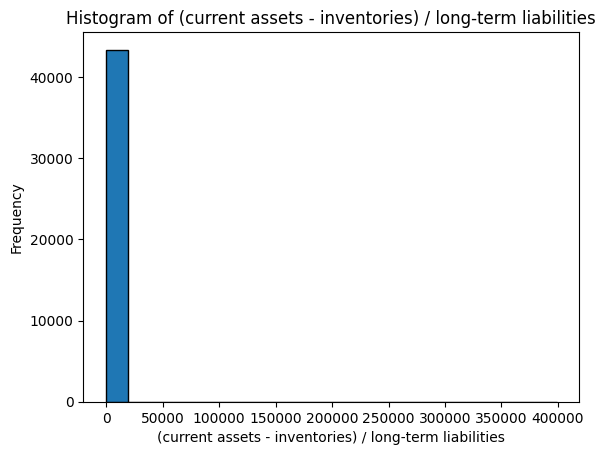

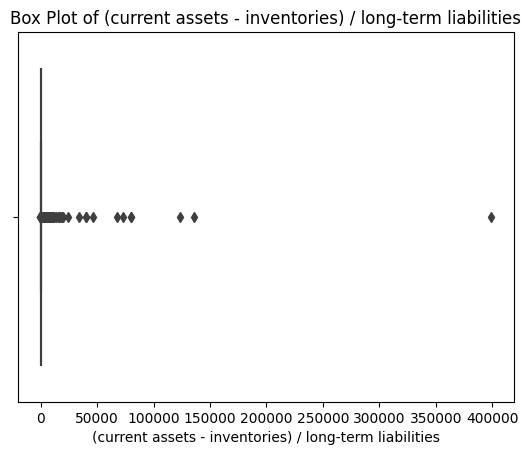



count     43405.000000
mean        105.085363
std        2294.068984
min        -525.520000
25%           2.485300
50%          47.120000
75%         105.085363
max      398920.000000
Name: (current assets - inventories) / long-term liabilities, dtype: float64


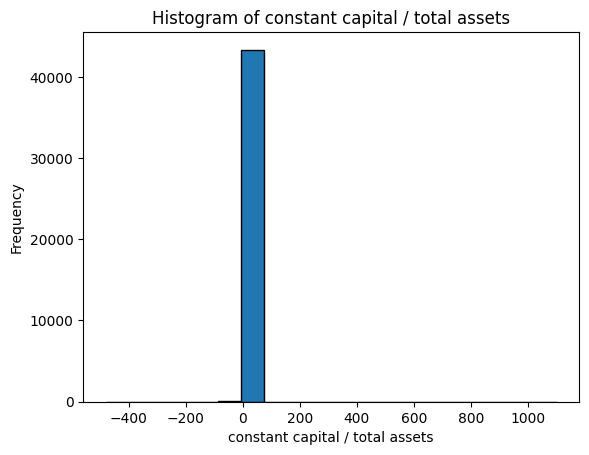

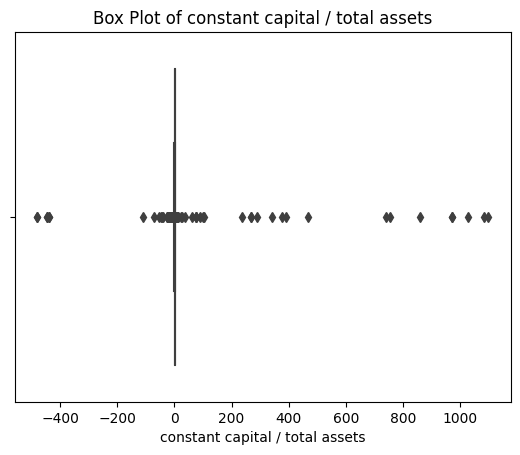



count    43405.000000
mean         0.724357
std         14.747911
min       -479.910000
25%          0.419840
50%          0.612280
75%          0.771810
max       1099.500000
Name: constant capital / total assets, dtype: float64


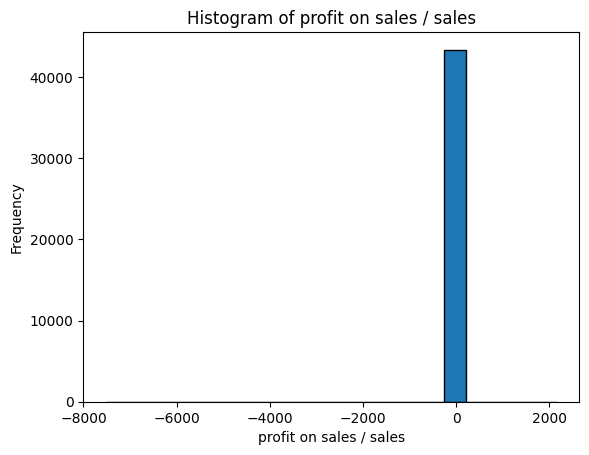

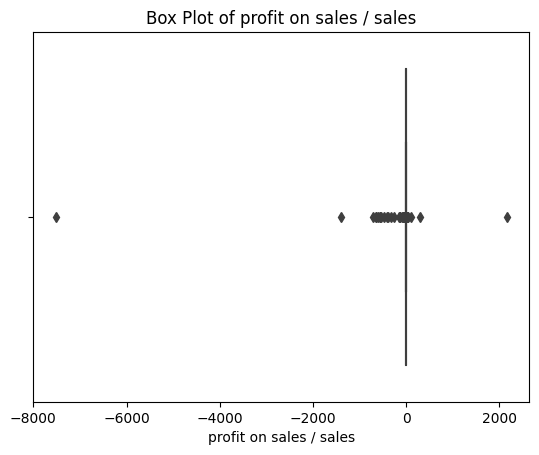



count    43405.000000
mean        -0.289102
std         39.198886
min      -7522.000000
25%          0.003907
50%          0.036652
75%          0.091532
max       2156.500000
Name: profit on sales / sales, dtype: float64


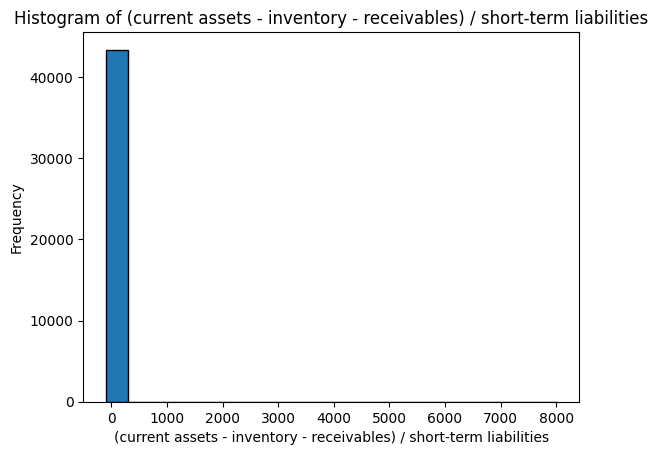

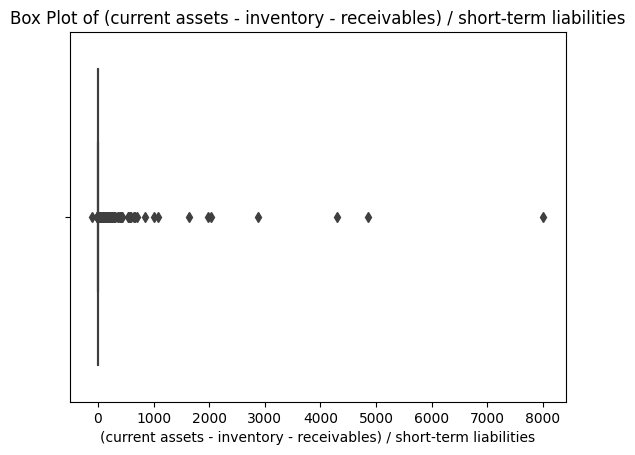



count    43405.000000
mean         2.147411
std         55.943322
min       -101.270000
25%          0.052877
50%          0.178130
75%          0.662320
max       8007.100000
Name: (current assets - inventory - receivables) / short-term liabilities, dtype: float64


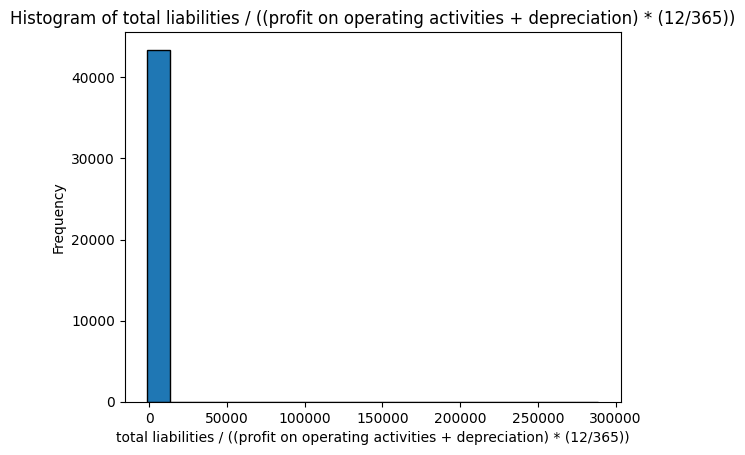

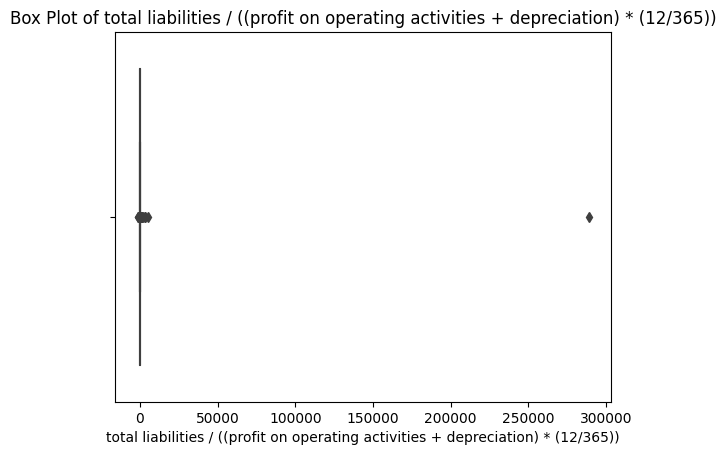



count     43405.000000
mean          7.717806
std        1386.634240
min       -1234.400000
25%           0.027543
50%           0.088181
75%           0.217020
max      288770.000000
Name: total liabilities / ((profit on operating activities + depreciation) * (12/365)), dtype: float64


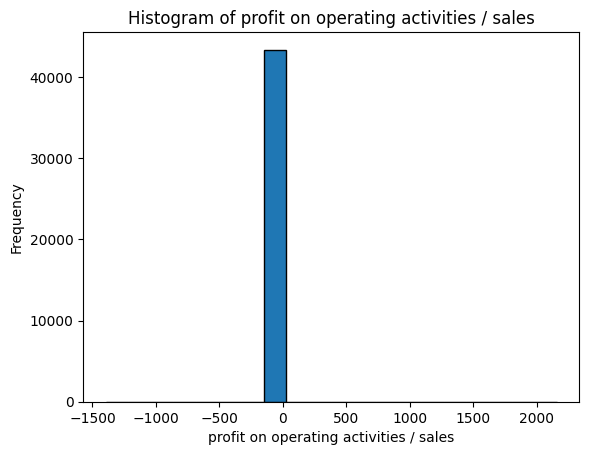

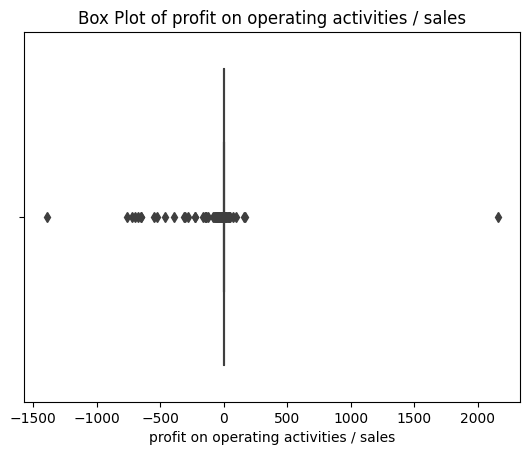



count    43405.000000
mean        -0.142514
std         15.967576
min      -1395.800000
25%          0.000000
50%          0.037770
75%          0.091865
max       2156.800000
Name: profit on operating activities / sales, dtype: float64


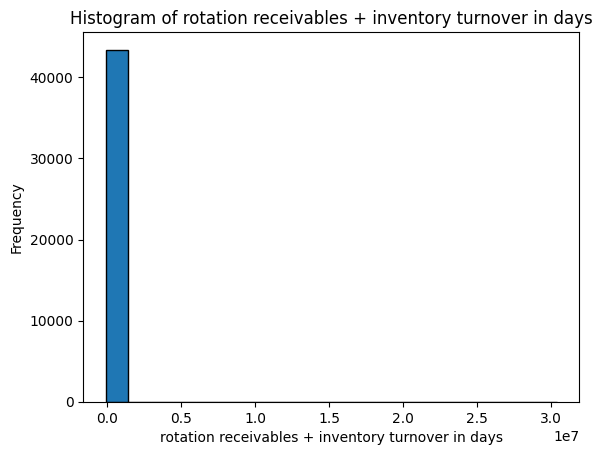

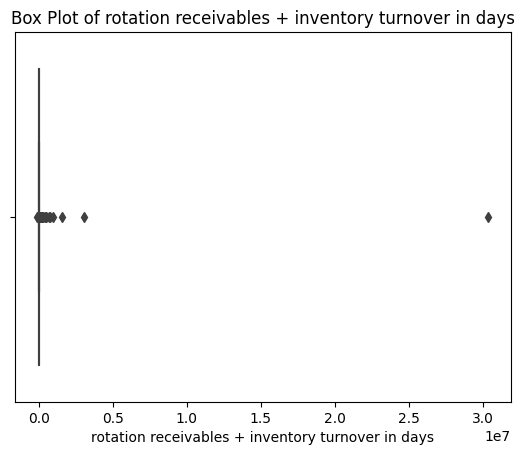



count    4.340500e+04
mean     1.074125e+03
std      1.470032e+05
min     -1.158700e+05
25%      6.670200e+01
50%      9.957900e+01
75%      1.412700e+02
max      3.039300e+07
Name: rotation receivables + inventory turnover in days, dtype: float64


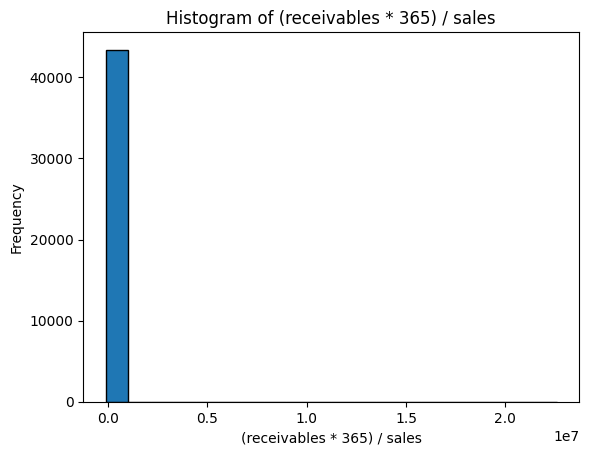

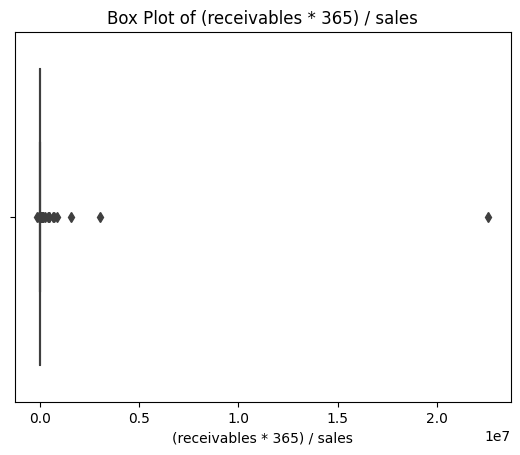



count    4.340500e+04
mean     8.311085e+02
std      1.098898e+05
min     -1.158700e+05
25%      3.493800e+01
50%      5.488100e+01
75%      8.082000e+01
max      2.258400e+07
Name: (receivables * 365) / sales, dtype: float64


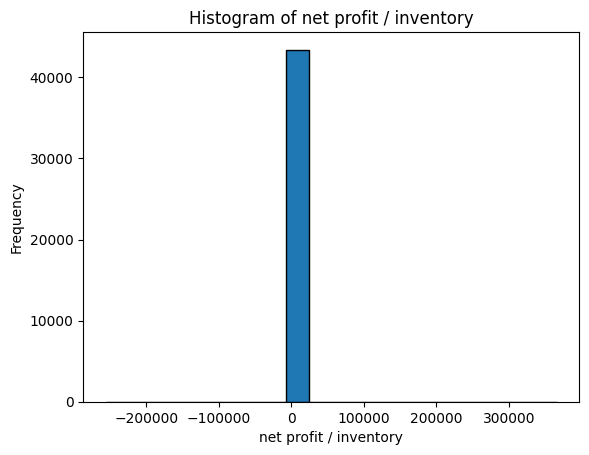

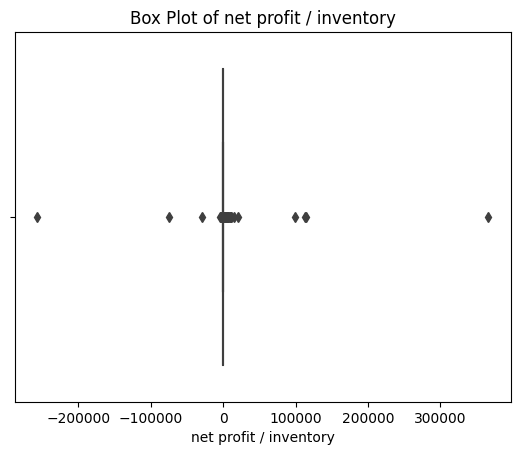



count     43405.000000
mean         14.825016
std        2367.417525
min     -256230.000000
25%           0.027707
50%           0.323390
75%           1.189800
max      366030.000000
Name: net profit / inventory, dtype: float64


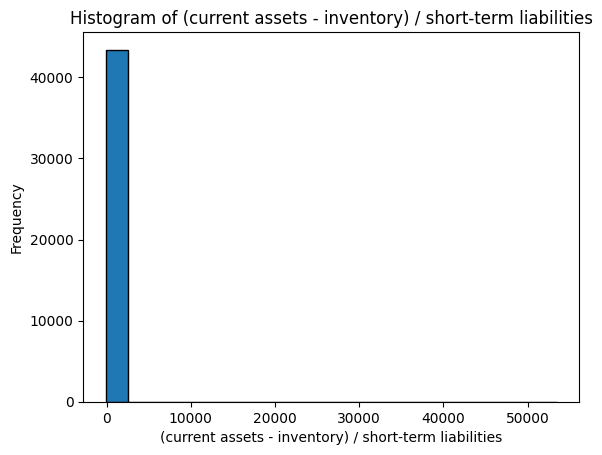

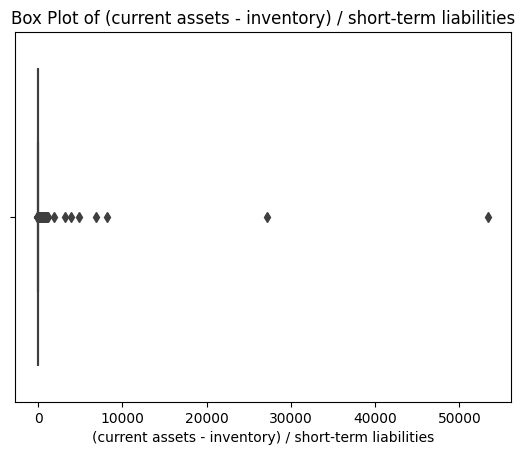



count    43405.000000
mean         5.428857
std        294.896517
min       -101.260000
25%          0.608610
50%          1.030000
75%          1.924900
max      53433.000000
Name: (current assets - inventory) / short-term liabilities, dtype: float64


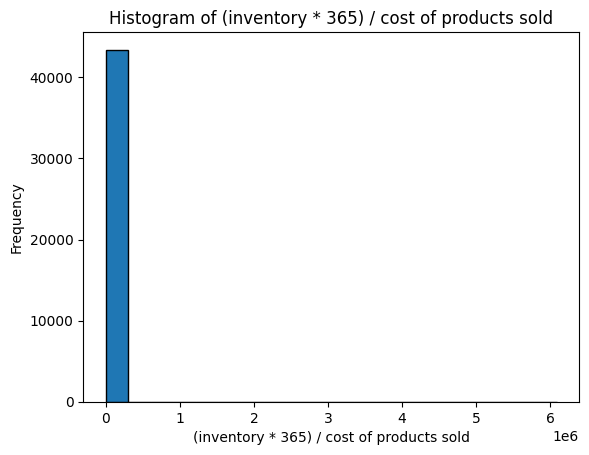

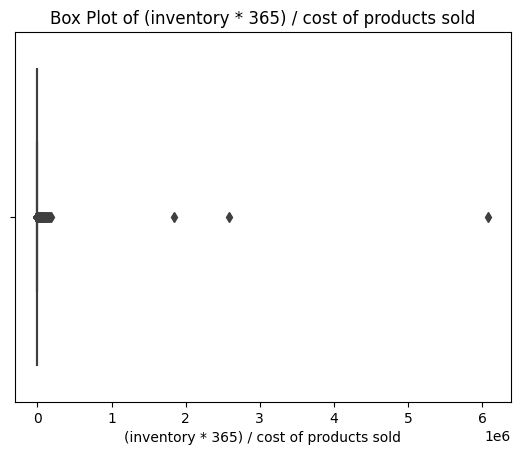



count    4.340500e+04
mean     3.578418e+02
std      3.303274e+04
min     -9.611000e+01
25%      1.637300e+01
50%      3.848200e+01
75%      7.124600e+01
max      6.084200e+06
Name: (inventory * 365) / cost of products sold, dtype: float64


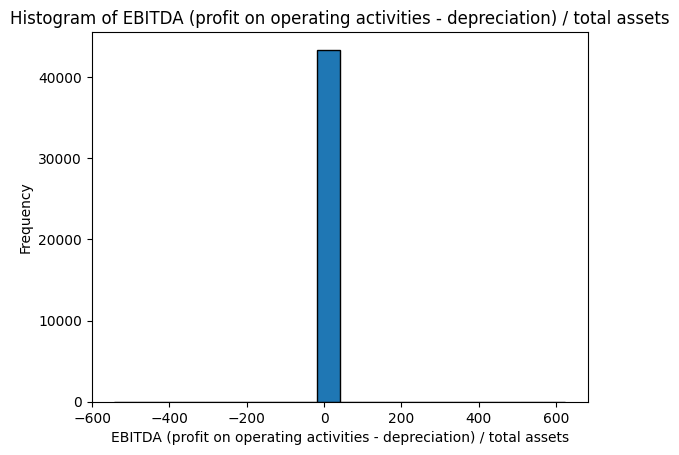

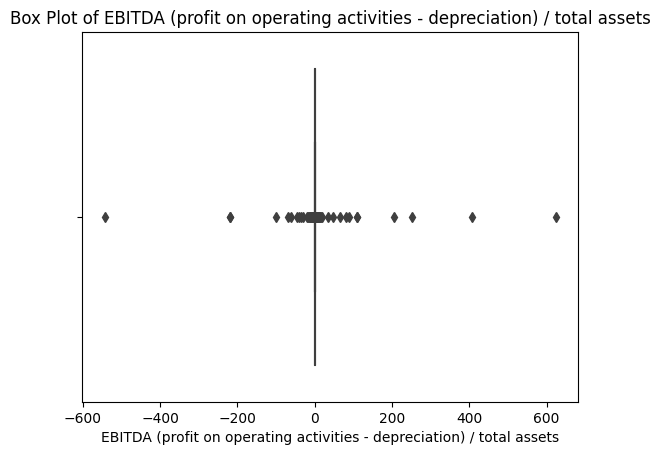



count    43405.000000
mean         0.028584
std          5.096793
min       -542.560000
25%         -0.038171
50%          0.018438
75%          0.107280
max        623.850000
Name: EBITDA (profit on operating activities - depreciation) / total assets, dtype: float64


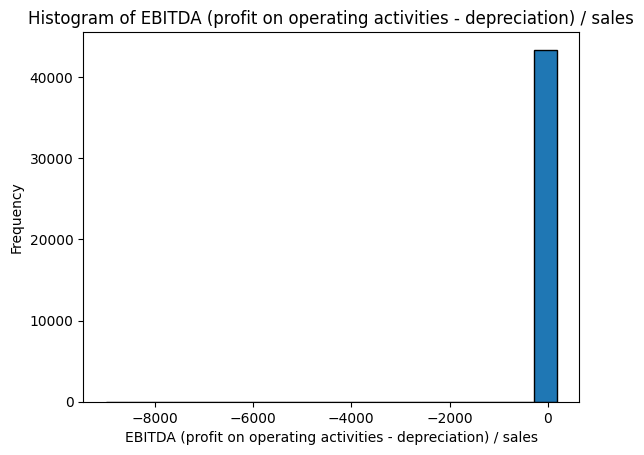

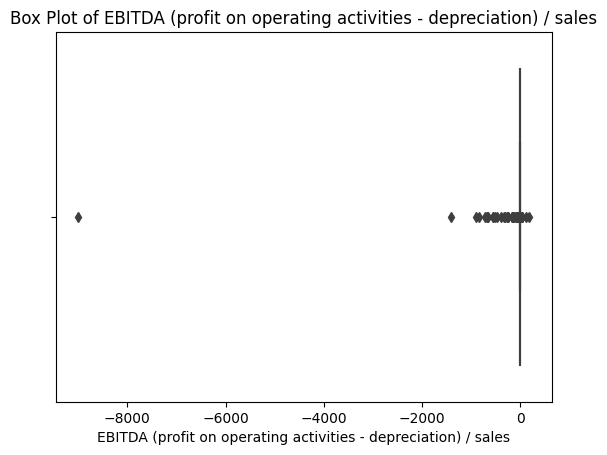



count    43405.000000
mean        -0.482584
std         45.086068
min      -9001.000000
25%         -0.027299
50%          0.010755
75%          0.062055
max        178.890000
Name: EBITDA (profit on operating activities - depreciation) / sales, dtype: float64


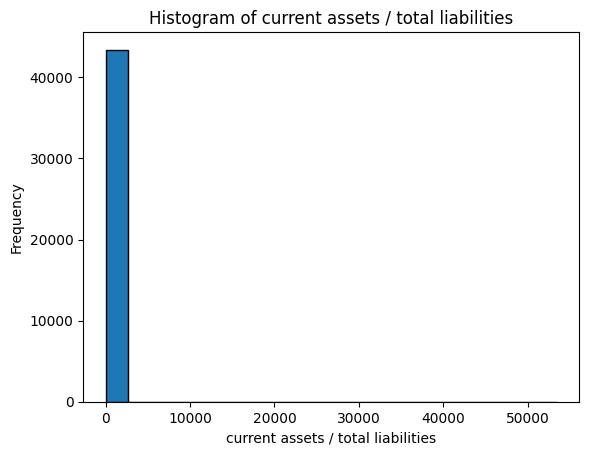

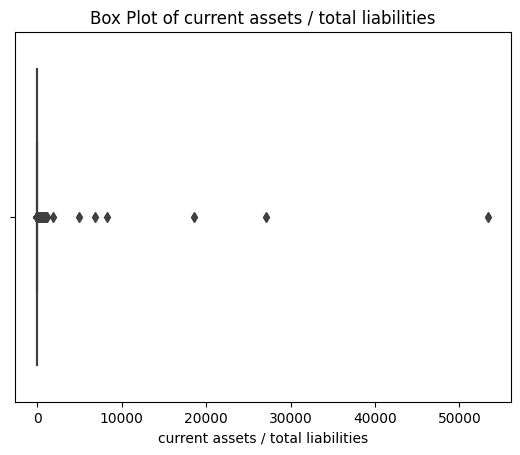



count    43405.000000
mean         5.835373
std        307.049658
min         -0.045239
25%          0.775870
50%          1.224700
75%          2.221800
max      53433.000000
Name: current assets / total liabilities, dtype: float64


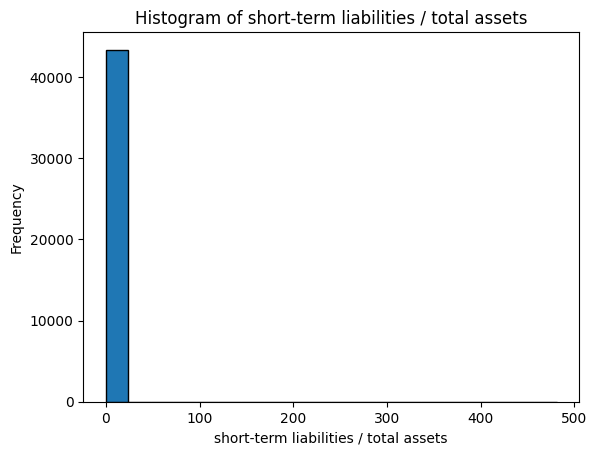

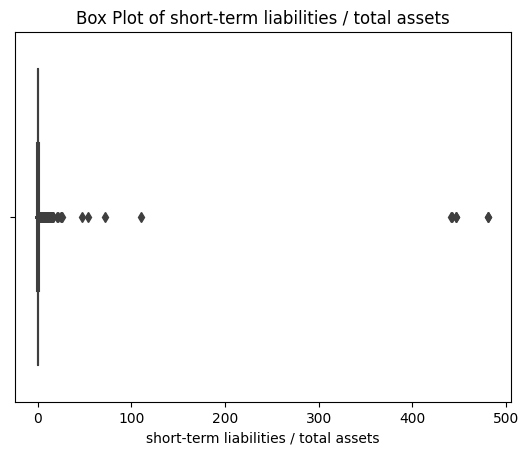



count    43405.000000
mean         0.483521
std          5.437856
min         -0.186610
25%          0.190100
50%          0.341080
75%          0.534630
max        480.960000
Name: short-term liabilities / total assets, dtype: float64


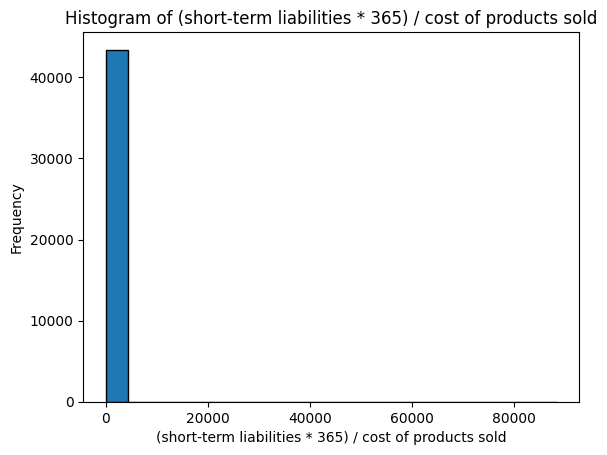

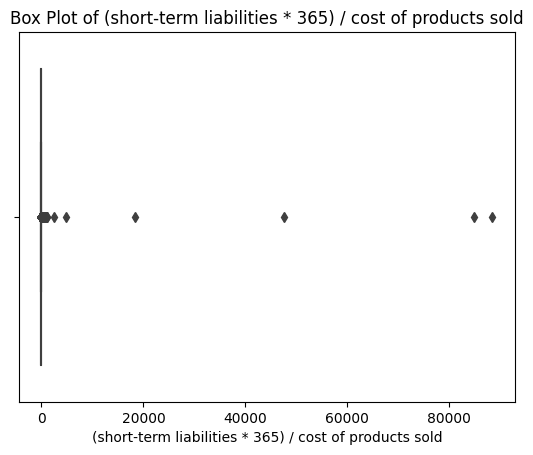



count    43405.000000
mean         6.478459
std        637.664847
min        -25.467000
25%          0.127380
50%          0.215770
75%          0.354540
max      88433.000000
Name: (short-term liabilities * 365) / cost of products sold, dtype: float64


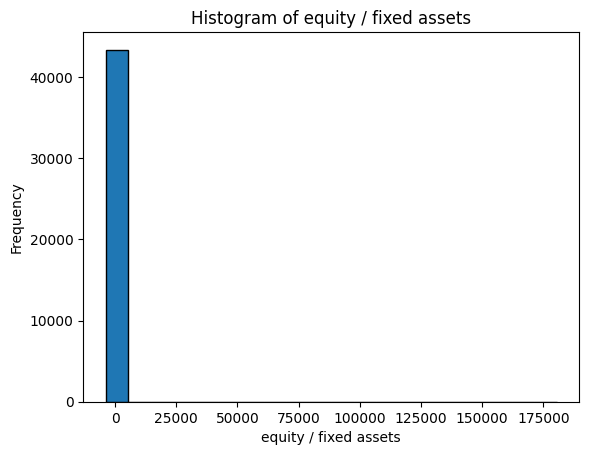

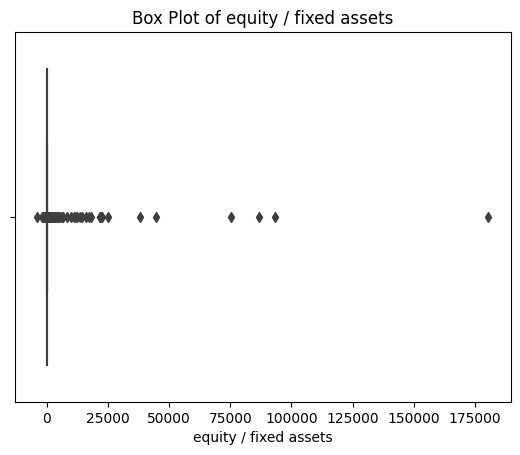



count     43405.000000
mean         23.772623
std        1202.390534
min       -3828.900000
25%           0.697750
50%           1.228600
75%           2.333300
max      180440.000000
Name: equity / fixed assets, dtype: float64


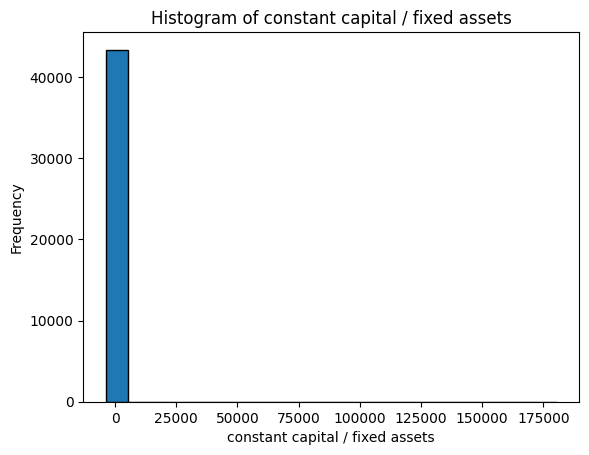

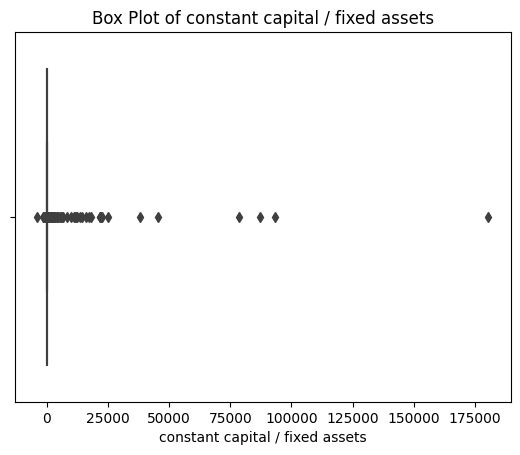



count     43405.000000
mean         24.654700
std        1209.410026
min       -3828.900000
25%           0.963610
50%           1.398000
75%           2.477700
max      180440.000000
Name: constant capital / fixed assets, dtype: float64


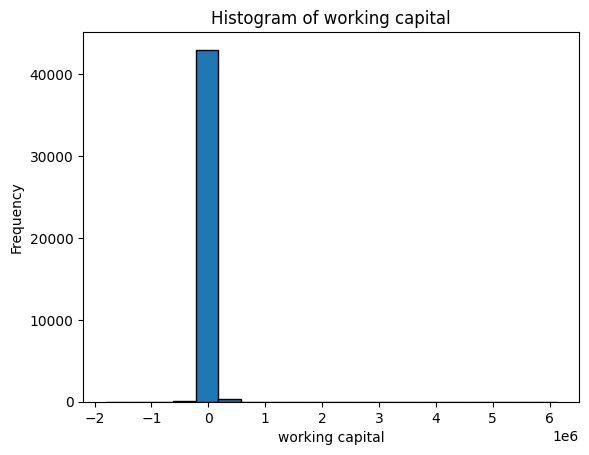

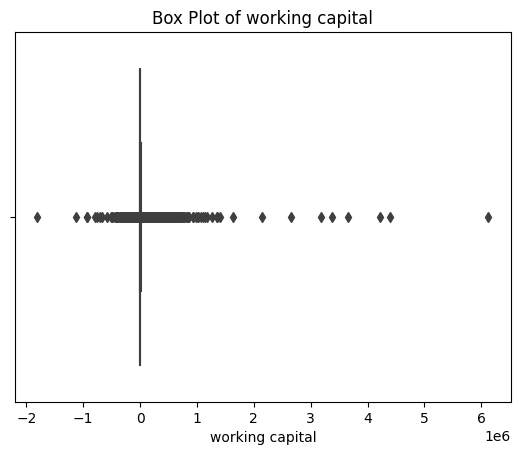



count    4.340500e+04
mean     7.672188e+03
std      7.005229e+04
min     -1.805200e+06
25%      2.757300e+01
50%      1.088400e+03
75%      4.993700e+03
max      6.123700e+06
Name: working capital, dtype: float64


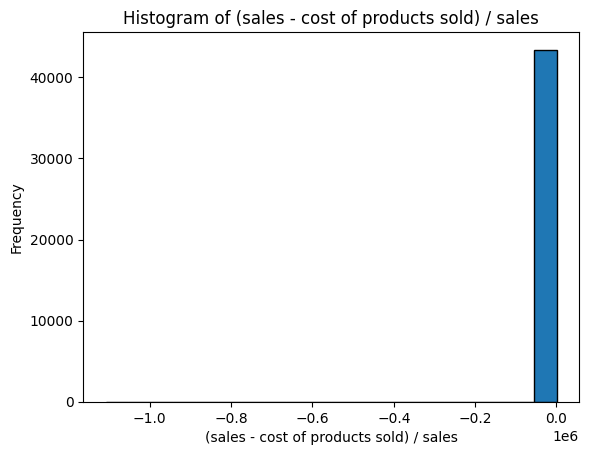

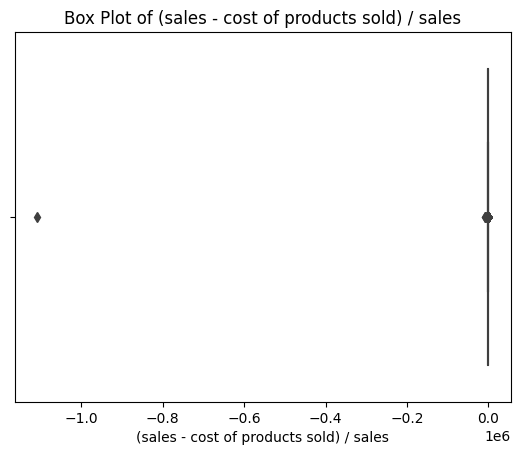



count    4.340500e+04
mean    -2.621959e+01
std      5.320062e+03
min     -1.108300e+06
25%      8.959000e-03
50%      5.270100e-02
75%      1.287800e-01
max      2.931500e+02
Name: (sales - cost of products sold) / sales, dtype: float64


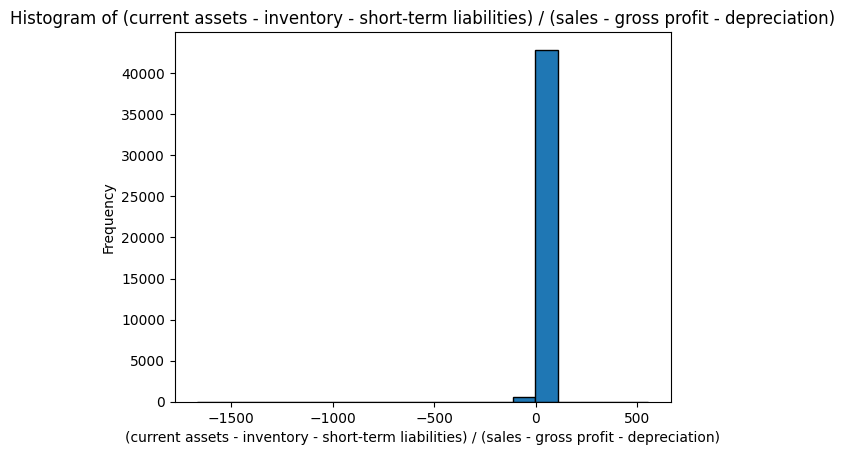

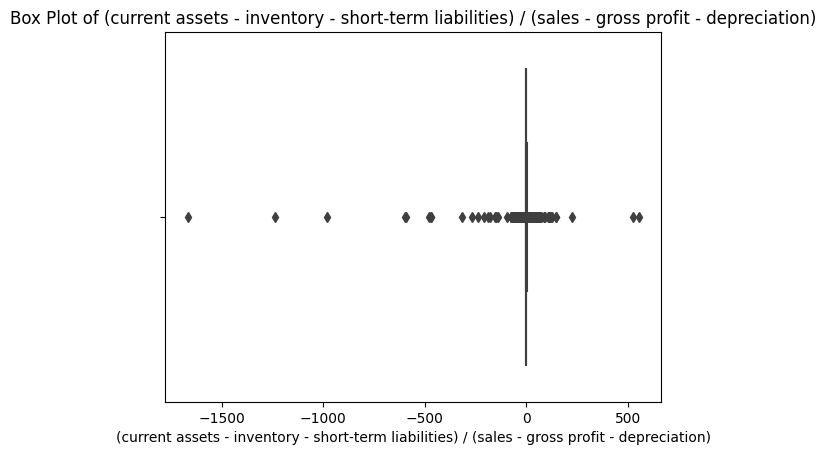



count    43405.000000
mean        -0.010510
std         13.672969
min      -1667.300000
25%          0.014632
50%          0.119650
75%          0.284570
max        552.640000
Name: (current assets - inventory - short-term liabilities) / (sales - gross profit - depreciation), dtype: float64


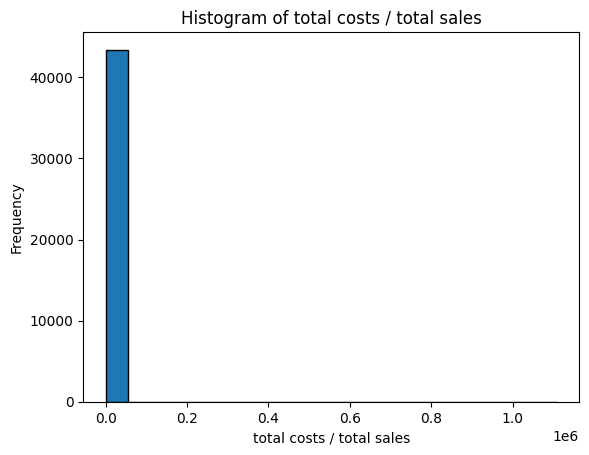

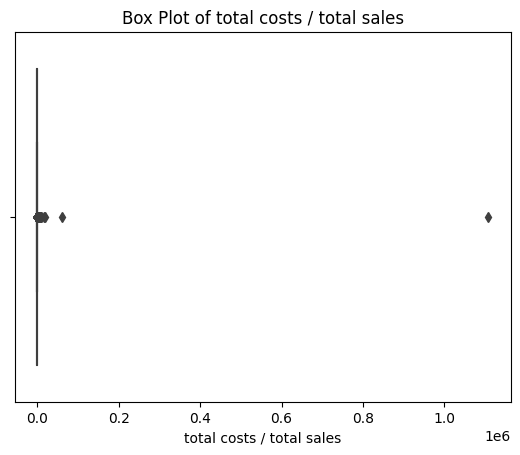



count    4.340500e+04
mean     3.002644e+01
std      5.329289e+03
min     -1.986900e+02
25%      8.755400e-01
50%      9.511200e-01
75%      9.928000e-01
max      1.108300e+06
Name: total costs / total sales, dtype: float64


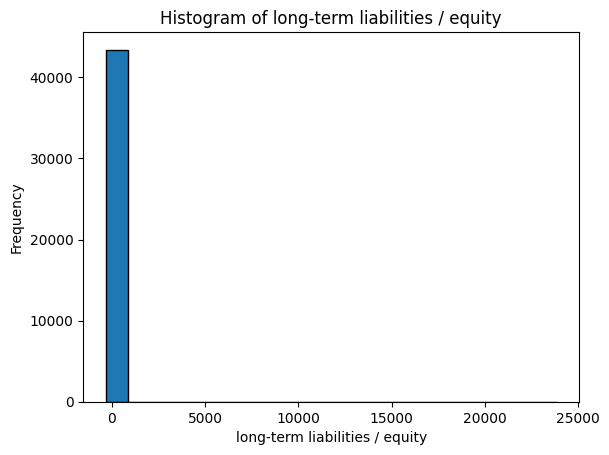

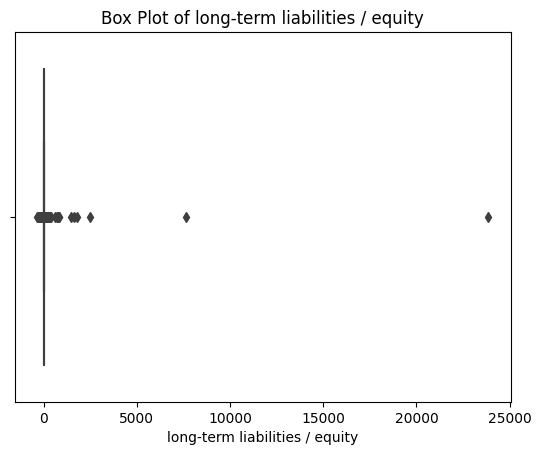



count    43405.000000
mean         1.333288
std        122.094599
min       -327.970000
25%          0.000000
50%          0.006389
75%          0.236280
max      23853.000000
Name: long-term liabilities / equity, dtype: float64


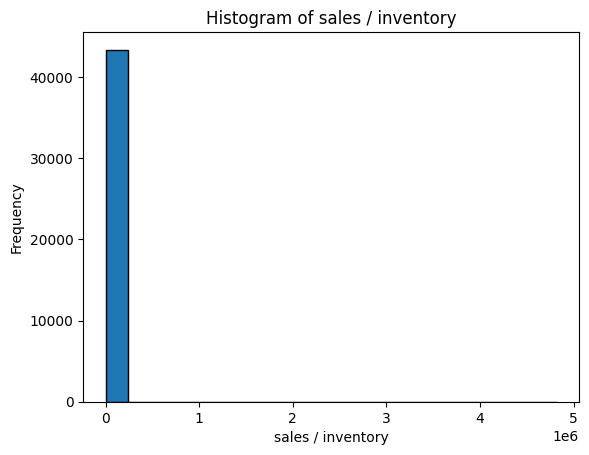

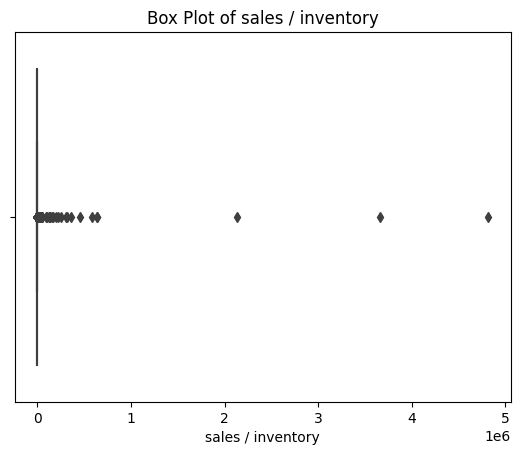



count    4.340500e+04
mean     4.480858e+02
std      3.153355e+04
min     -1.244000e+01
25%      5.729400e+00
50%      1.040000e+01
75%      2.389000e+01
max      4.818700e+06
Name: sales / inventory, dtype: float64


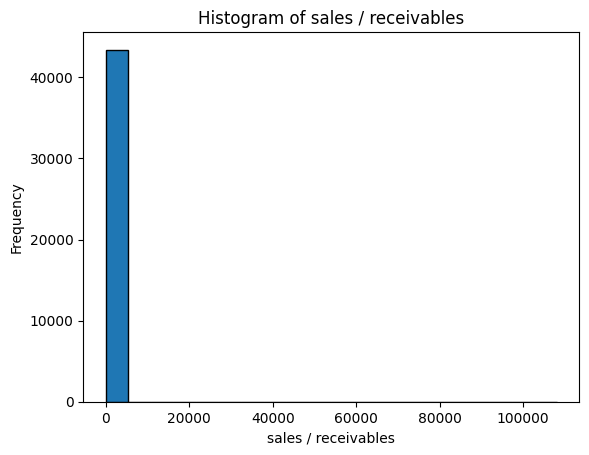

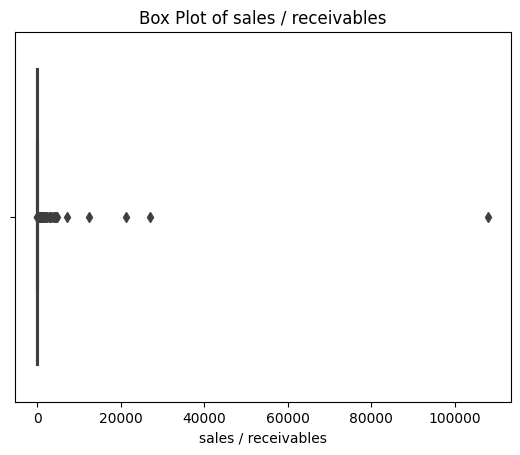



count     43405.000000
mean         17.033202
std         552.399187
min         -12.656000
25%           4.515600
50%           6.649500
75%          10.443000
max      108000.000000
Name: sales / receivables, dtype: float64


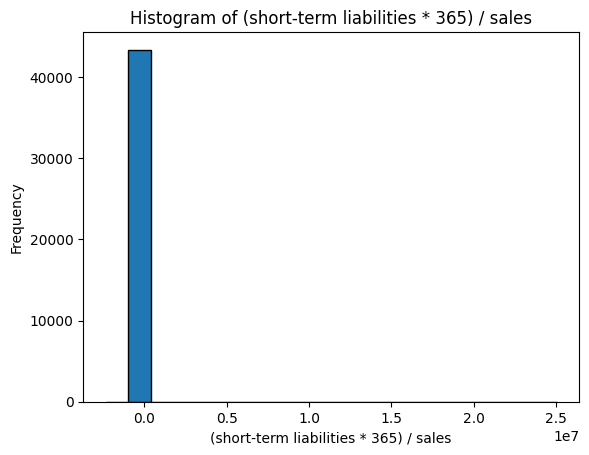

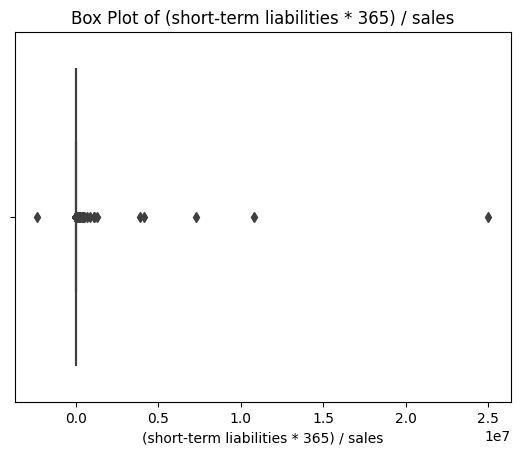



count    4.340500e+04
mean     1.502328e+03
std      1.390628e+05
min     -2.336500e+06
25%      4.220500e+01
50%      7.153500e+01
75%      1.177400e+02
max      2.501600e+07
Name: (short-term liabilities * 365) / sales, dtype: float64


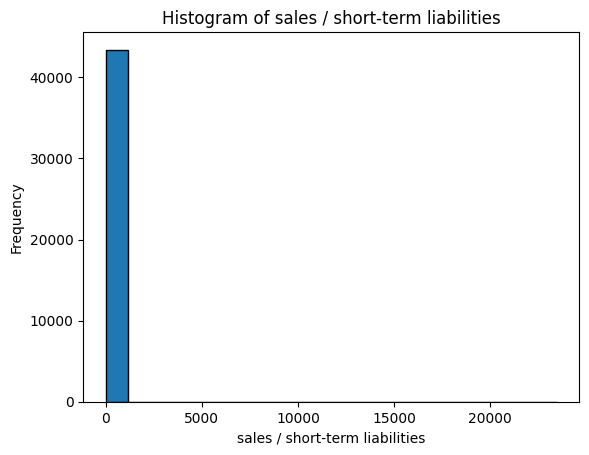

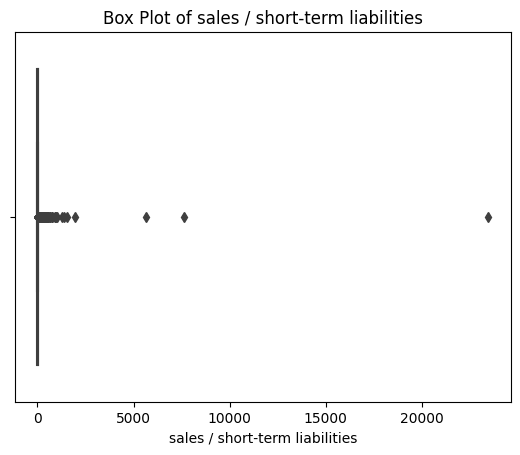



count    43405.000000
mean         9.343074
std        123.985521
min         -1.543200
25%          3.100200
50%          5.102900
75%          8.650900
max      23454.000000
Name: sales / short-term liabilities, dtype: float64


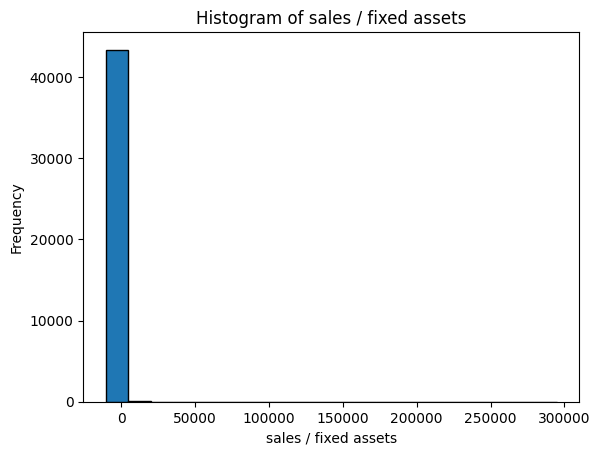

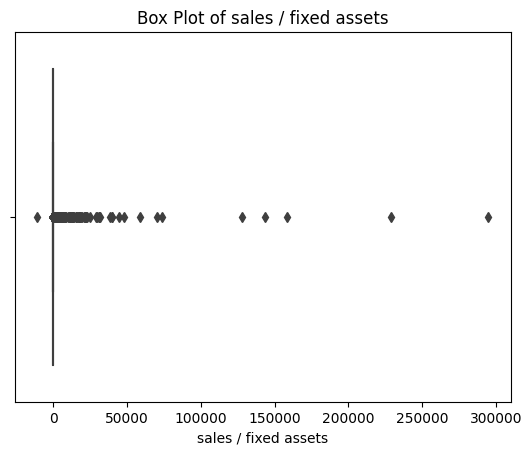



count     43405.000000
mean         72.788592
std        2347.072100
min      -10677.000000
25%           2.207800
50%           4.389200
75%          10.461000
max      294770.000000
Name: sales / fixed assets, dtype: float64


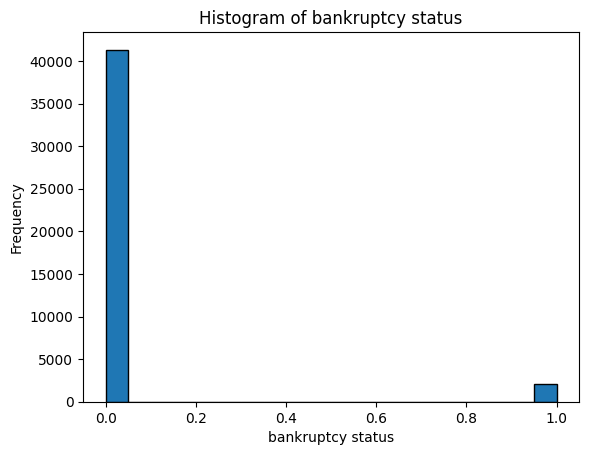

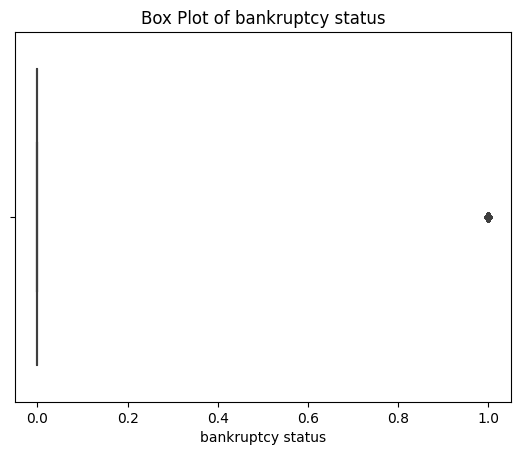



count    43405.000000
mean         0.048174
std          0.214137
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: bankruptcy status, dtype: float64


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [81]:
list(map(lambda col: univariate_analysis(all_data_reset, col), formula))

## Bivariante analysis


In [82]:
def scatterplo(data,feature):
    plt.scatter(data[feature], data['bankruptcy status'])  # Replace 'target_variable' with your actual target column
    plt.xlabel(feature)
    plt.ylabel('Target Variable')
    plt.title(f'Scatter Plot: {feature} vs. Target Variable')
    plt.show()

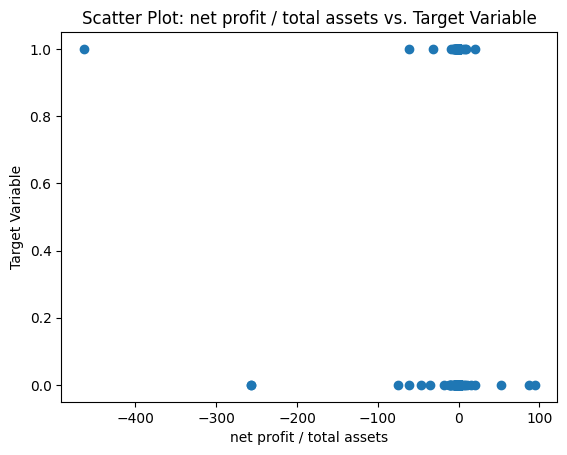

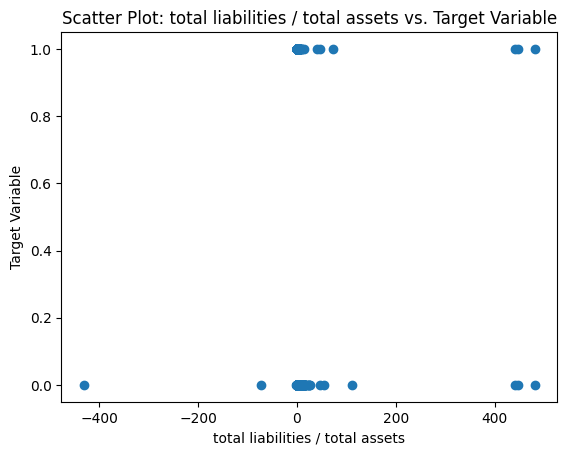

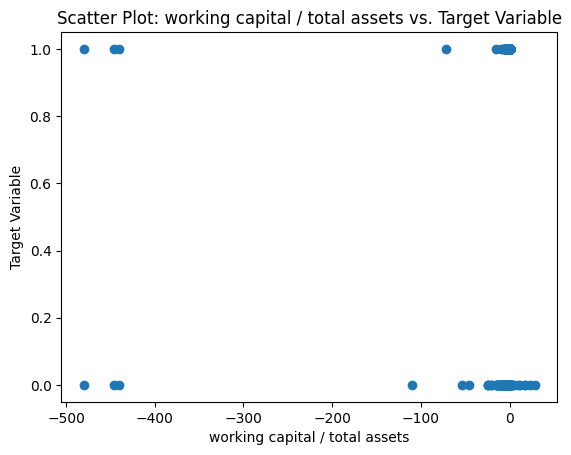

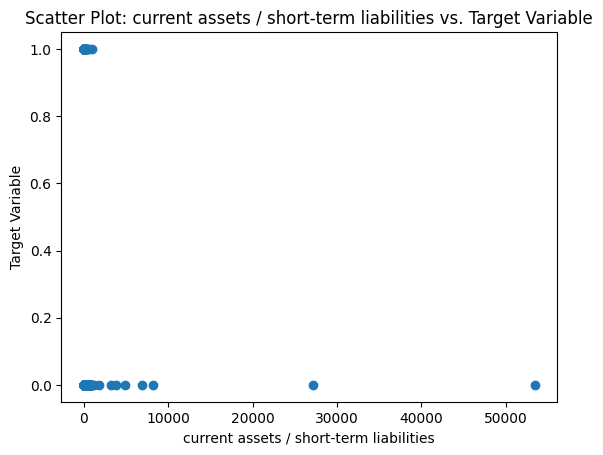

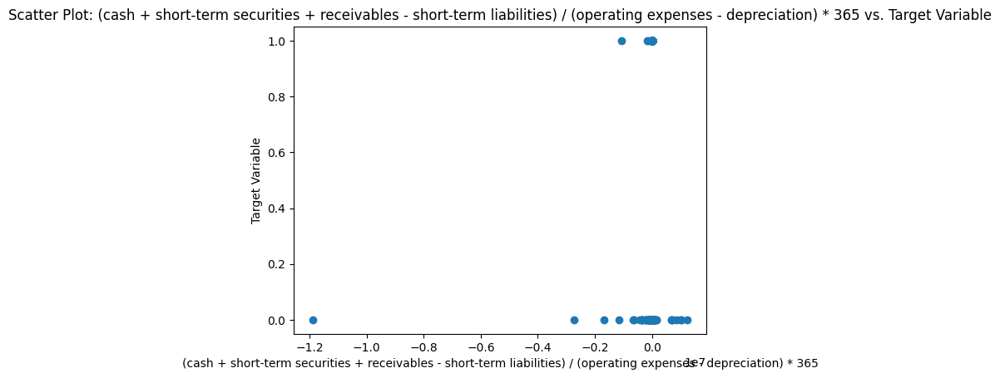

...

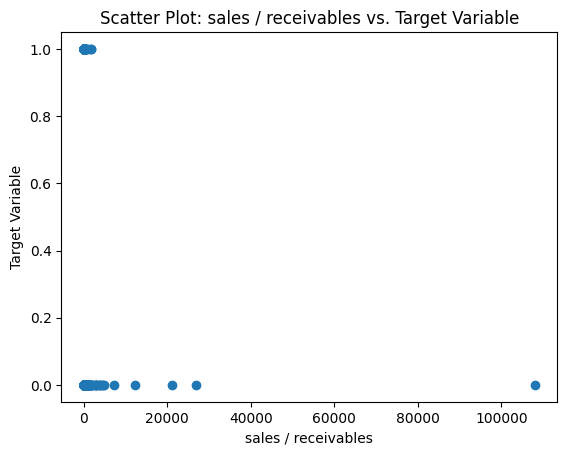

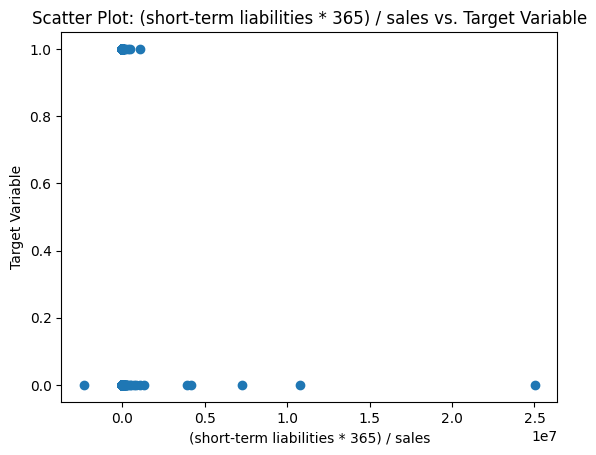

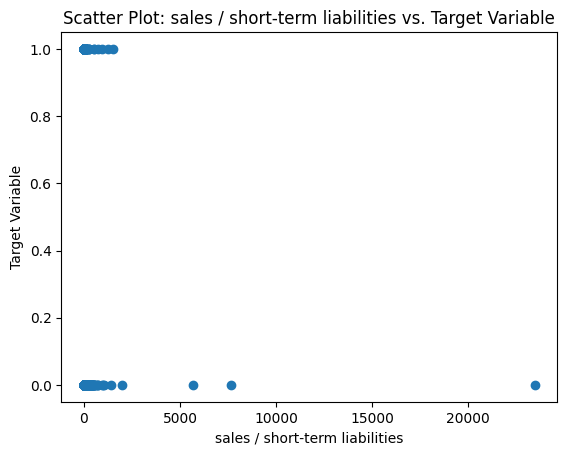

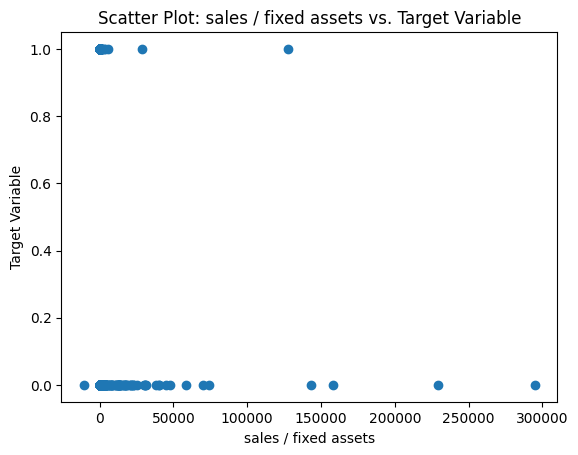

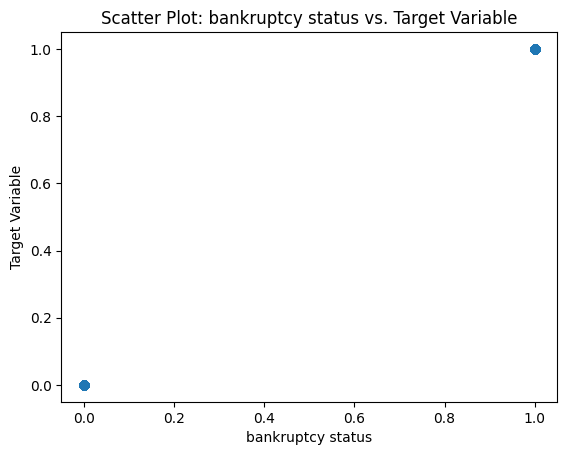

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [83]:
list(map(lambda col: scatterplo(all_data_reset, col), formula))

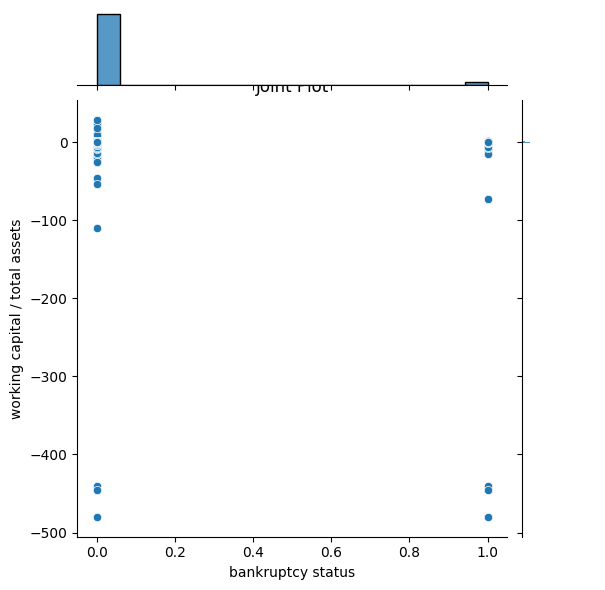

In [84]:
sns.jointplot(x="bankruptcy status", y= 'working capital / total assets', data=all_data_reset, kind='scatter')
plt.title('Joint Plot')
plt.show()

### Handling imbalanced data


In [85]:
class_counts = all_data_reset['bankruptcy status'].value_counts()

# Display the counts
print(class_counts)


0    41314
1     2091
Name: bankruptcy status, dtype: int64


In [86]:
from imblearn.over_sampling import SMOTE

In [87]:
X = all_data_reset.drop('bankruptcy status', axis=1)
y = all_data_reset['bankruptcy status']

# Apply SMOTE to oversample the minority class
smote = SMOTE(sampling_strategy='auto')
X_smote, y_smote = smote.fit_resample(X, y)

# Create a new DataFrame with the oversampled data
balanced_data = pd.concat([pd.DataFrame(X_smote, columns=X.columns), pd.Series(y_smote, name='bankruptcy status')], axis=1)

# Display the class distribution
class_counts = balanced_data['bankruptcy status'].value_counts()
print(class_counts)

0    41314
1    41314
Name: bankruptcy status, dtype: int64


### PCA: principale components analysis


In [88]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

In [89]:
X_train, X_test, y_train, y_test = train_test_split(
 all_data_reset.drop('bankruptcy status', axis=1), all_data_reset['bankruptcy status'], test_size=0.3,
random_state=0)


In [90]:
pca = PCA(n_components=None)

In [91]:
pca.fit(X_train)

PCA()

In [92]:
train_t = pca.transform(X_train)
test_t = pca.transform(X_test)

Text(0, 0.5, 'Percentage of Variance Explained')

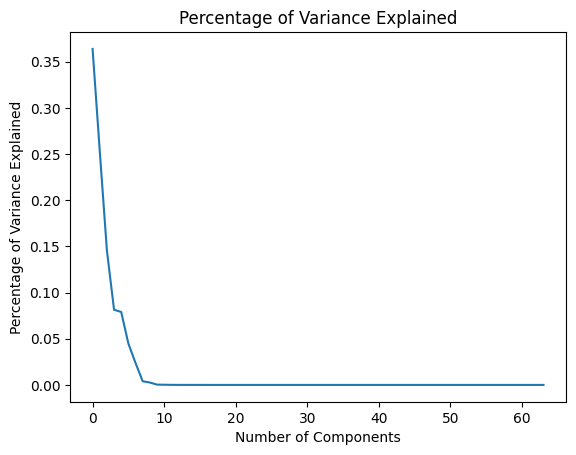

In [93]:
plt.plot(pca.explained_variance_ratio_)
plt.title('Percentage of Variance Explained')
plt.xlabel('Number of Components')
plt.ylabel('Percentage of Variance Explained')

he preceding plot indicates that we can use the first ten components to train our machine
learning models using a linear model.

###Features selections


In [94]:
all_data_reset.columns

Index(['net profit / total assets', 'total liabilities / total assets',
       'working capital / total assets',
       'current assets / short-term liabilities',
       '(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365',
       'retained earnings / total assets', 'EBIT / total assets',
       'book value of equity / total liabilities', 'sales / total assets',
       'equity / total assets',
       '(gross profit + extraordinary items + financial expenses) / total assets',
       'gross profit / short-term liabilities',
       '(gross profit + depreciation) / sales',
       '(gross profit + interest) / total assets',
       '(total liabilities * 365) / (gross profit + depreciation)',
       '(gross profit + depreciation) / total liabilities',
       'total assets / total liabilities', 'gross profit / total assets',
       'gross profit / sales', '(inventory * 365) / sales',
       'sales (n) / sales (n-1)',
       'profit

In [95]:
X = all_data_reset.drop("bankruptcy status",axis=1)
y = all_data_reset["bankruptcy status"]

In [96]:
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model=ExtraTreesClassifier()
model.fit(X,y)

ExtraTreesClassifier()

In [97]:
print(model.feature_importances_)

[0.01379839 0.01425523 0.01580382 0.01256798 0.01190288 0.01381523
 0.01355042 0.01256779 0.01528483 0.01330774 0.01487751 0.01130054
 0.01153554 0.01346401 0.01473045 0.01266084 0.01223774 0.01312783
 0.01106567 0.01561931 0.02029501 0.0164051  0.01092316 0.02090685
 0.01566151 0.01261942 0.10624507 0.01153558 0.01667893 0.01144125
 0.01095077 0.01412437 0.01412166 0.02053719 0.01809708 0.01455616
 0.01201968 0.01559629 0.01471955 0.01405957 0.01210537 0.01301468
 0.01214135 0.01522491 0.01251948 0.02776028 0.01448766 0.01271589
 0.01193131 0.01326948 0.01934834 0.01195492 0.01106263 0.01145926
 0.01544057 0.01663169 0.01267482 0.02038395 0.01047493 0.01431189
 0.01611869 0.01163616 0.01245618 0.01190758]


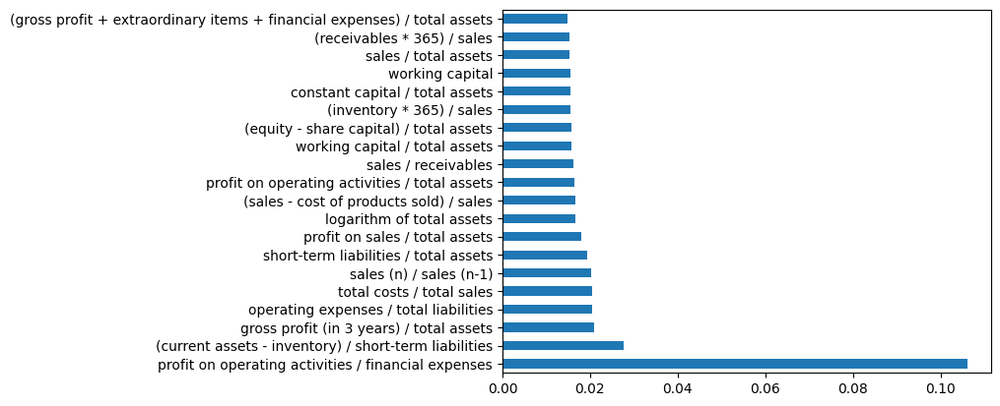

In [98]:
ranked_features=pd.Series(model.feature_importances_,index=X.columns)
ranked_features.nlargest(20).plot(kind='barh')
plt.show()

In [99]:
X.head()

,net profit / total assets,total liabilities / total assets,working capital / total assets,current assets / short-term liabilities,(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365,retained earnings / total assets,EBIT / total assets,book value of equity / total liabilities,sales / total assets,equity / total assets,...,working capital,(sales - cost of products sold) / sales,(current assets - inventory - short-term liabilities) / (sales - gross profit - depreciation),total costs / total sales,long-term liabilities / equity,sales / inventory,sales / receivables,(short-term liabilities * 365) / sales,sales / short-term liabilities,sales / fixed assets
0,0.200550,0.37951,0.39641,2.0472,32.3510,0.38825,0.249760,1.33050,1.1389,0.50494,...,348690.0,0.121960,0.39718,0.87804,0.001924,8.4160,5.1372,82.658,4.4158,7.4277
1,0.209120,0.49988,0.47225,1.9447,14.7860,0.00000,0.258340,0.99601,1.6996,0.49788,...,2304.6,0.121300,0.42002,0.85300,0.000000,4.1486,3.2732,107.350,3.4000,60.9870
2,0.248660,0.69592,0.26713,1.5548,-1.1523,0.00000,0.309060,0.43695,1.3090,0.30408,...,6332.7,0.241140,0.81774,0.76599,0.694840,4.9909,3.9510,134.270,2.7185,5.2078
3,0.081483,0.30734,0.45879,2.4928,51.9520,0.14988,0.092704,1.86610,1.0571,0.57353,...,20545.0,0.054015,0.14207,0.94598,0.000000,4.5746,3.6147,86.435,4.2228,5.5497
4,0.187320,0.61323,0.22960,1.4063,-7.3128,0.18732,0.187320,0.63070,1.1559,0.38677,...,3186.6,0.134850,0.48431,0.86515,0.124440,6.3985,4.3158,127.210,2.8692,7.8980


In [100]:
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.3,
    random_state=0)

X_train.shape, X_test.shape

((30383, 64), (13022, 64))

In [101]:
X_train.corr()

,net profit / total assets,total liabilities / total assets,working capital / total assets,current assets / short-term liabilities,(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365,retained earnings / total assets,EBIT / total assets,book value of equity / total liabilities,sales / total assets,equity / total assets,...,working capital,(sales - cost of products sold) / sales,(current assets - inventory - short-term liabilities) / (sales - gross profit - depreciation),total costs / total sales,long-term liabilities / equity,sales / inventory,sales / receivables,(short-term liabilities * 365) / sales,sales / short-term liabilities,sales / fixed assets
net profit / total assets,1.000000,-0.115885,0.046876,0.000624,0.000370,0.422449,0.387876,0.000185,-0.127962,-0.178983,...,0.005024,0.000331,0.007738,-0.004419,-0.000219,0.000270,0.000090,0.001066,0.002262,-0.059740
total liabilities / total assets,-0.115885,1.000000,-0.866158,-0.002491,-0.022448,-0.817981,0.164305,-0.002769,-0.025332,-0.417168,...,-0.012987,-0.000678,-0.001063,0.000658,0.000817,-0.000030,-0.001673,0.048081,-0.003187,-0.007771
working capital / total assets,0.046876,-0.866158,1.000000,0.003895,0.025587,0.674134,0.027737,0.000906,-0.003201,0.345337,...,0.016922,0.000286,0.001095,-0.000384,-0.000374,0.000045,0.000025,-0.055188,0.004112,-0.000209
current assets / short-term liabilities,0.000624,-0.002491,0.003895,1.000000,0.002001,-0.000233,0.000335,0.357643,-0.000448,0.001081,...,0.000725,-0.003503,0.000243,0.000541,-0.000462,0.000222,0.009194,-0.000046,0.078136,0.000162
(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365,0.000370,-0.022448,0.025587,0.002001,1.000000,0.017619,0.000229,0.001134,0.000470,0.009052,...,0.002012,0.000108,-0.000025,-0.000068,0.000068,0.000088,-0.000001,-0.001935,0.000378,0.000221
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sales / inventory,0.000270,-0.000030,0.000045,0.000222,0.000088,-0.000204,0.074933,0.000134,0.112439,-0.000175,...,-0.001054,0.000108,-0.001130,0.000008,0.000805,1.000000,0.015148,-0.000073,0.127717,0.018968
sales / receivables,0.000090,-0.001673,0.000025,0.009194,-0.000001,0.000655,0.063218,0.003951,0.097539,0.011716,...,-0.002350,0.000392,0.000366,-0.000313,-0.000229,0.015148,1.000000,-0.000301,0.109216,0.077423
(short-term liabilities * 365) / sales,0.001066,0.048081,-0.055188,-0.000046,-0.001935,-0.039130,0.000425,0.000091,-0.000426,-0.019347,...,-0.009205,-0.142926,-0.000171,0.022850,-0.000013,-0.000073,-0.000301,1.000000,-0.000743,-0.000318
sales / short-term liabilities,0.002262,-0.003187,0.004112,0.078136,0.000378,0.000505,0.529428,0.044856,0.786493,0.001594,...,0.000200,0.000731,0.001230,-0.000680,-0.000582,0.127717,0.109216,-0.000743,1.000000,0.139540


In [102]:
plt.figure(figsize=(100,100))
cor = X_train.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

In [103]:
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j])> threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [104]:
corr_features = correlation(X_train, 0.8)
len(set(corr_features))

30

In [105]:
corr_features

{'(current assets - inventory) / short-term liabilities',
 '(equity - share capital) / total assets',
 '(gross profit + depreciation) / total liabilities',
 '(gross profit + extraordinary items + financial expenses) / total assets',
 '(gross profit + interest) / sales',
 '(gross profit + interest) / total assets',
 '(inventory * 365) / cost of products sold',
 '(net profit + depreciation) / total liabilities',
 '(receivables * 365) / sales',
 '(short-term liabilities * 365) / sales',
 'EBITDA (profit on operating activities - depreciation) / sales',
 'EBITDA (profit on operating activities - depreciation) / total assets',
 'constant capital / fixed assets',
 'constant capital / total assets',
 'current assets / total liabilities',
 'gross profit (in 3 years) / total assets',
 'gross profit / total assets',
 'net profit / sales',
 'operating expenses / total liabilities',
 'profit on operating activities / total assets',
 'profit on sales / total assets',
 'retained earnings / total ass

In [106]:
X_train.drop(corr_features,axis=1)
X_test.drop(corr_features,axis=1)

,net profit / total assets,total liabilities / total assets,current assets / short-term liabilities,(cash + short-term securities + receivables - short-term liabilities) / (operating expenses - depreciation) * 365,EBIT / total assets,book value of equity / total liabilities,sales / total assets,equity / total assets,gross profit / short-term liabilities,(gross profit + depreciation) / sales,...,profit on operating activities / sales,net profit / inventory,(short-term liabilities * 365) / cost of products sold,equity / fixed assets,working capital,(sales - cost of products sold) / sales,(current assets - inventory - short-term liabilities) / (sales - gross profit - depreciation),total costs / total sales,long-term liabilities / equity,sales / receivables
41755,0.143880,0.365840,2.05000,20.01400,0.132530,1.68880,1.20760,0.61781,0.527650,0.126780,...,0.146000,1.232000,0.274380,1.27350,414730.00,0.241970,0.232890,0.79519,0.18561,17.0190
29877,0.033744,0.580670,1.62520,-1.21510,0.041220,0.72216,2.19370,0.41933,0.094861,0.035629,...,0.027252,0.123240,0.200660,1.42740,3363.60,0.012848,0.080470,0.98172,0.32469,5.4462
15386,0.185160,0.097592,8.10490,280.28000,0.185160,9.24680,1.59010,0.90241,1.897200,0.195750,...,0.000000,1.047600,0.124100,4.31720,327.62,0.505410,0.205180,0.49642,0.00000,5.6025
829,0.371760,0.145240,6.17060,96.45900,0.463400,5.88490,3.28240,0.85476,3.190500,0.143990,...,0.142410,14.825016,0.051650,8.23890,1303.00,0.143280,0.434930,0.85946,0.00000,7.0570
16030,0.115100,0.471910,2.23510,28.47600,0.159760,1.11910,2.73130,0.52809,0.371400,0.061218,...,0.074740,0.365170,0.169800,13.69900,2220.10,0.072500,0.217960,0.94223,0.00000,4.9374
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37585,0.229930,0.123290,6.70610,123.23000,0.284550,7.11080,1.80780,0.87671,2.311800,0.161240,...,0.159610,1.232200,0.081593,5.02260,8763.30,0.165550,0.262270,0.84404,0.00000,4.2511
14632,0.035505,0.489880,0.45189,3182.60000,0.046165,1.04130,0.96483,0.51012,0.256080,0.137020,...,0.066741,9.245400,0.162470,0.55536,-253.06,-0.121180,0.069602,1.16890,0.40343,18.3790
4303,0.075607,0.865590,1.00630,-30.46300,0.094603,0.15528,2.97470,0.13441,0.132250,0.039169,...,0.041813,11.091000,0.248170,0.47975,17.10,0.031020,0.562520,0.96284,1.11600,7.6850
23379,0.034074,0.231610,4.10670,37.73900,0.050472,3.31760,1.01590,0.76839,0.217920,0.021708,...,0.022464,0.086979,0.077104,15.73000,1431.30,0.015626,0.044344,0.98437,0.00000,14.4850


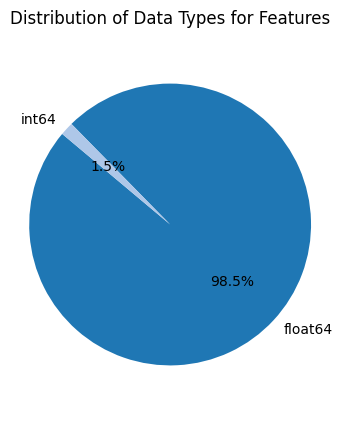

In [107]:
data_type_counts = all_data_reset.dtypes.value_counts()

# Create a pie chart
plt.figure(figsize=(4, 5))
plt.pie(data_type_counts, labels=data_type_counts.index, autopct='%1.1f%%', startangle=140, colors=plt.cm.tab20.colors)
plt.title("Distribution of Data Types for Features")
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

###Information Gain


In [108]:
from sklearn.feature_selection import mutual_info_classif

In [109]:
mutual_info=mutual_info_classif(X,y)

In [110]:
mutual_data=pd.Series(mutual_info,index=X.columns)
mutual_data.sort_values(ascending=False)

profit on operating activities / financial expenses                                 0.028307
gross profit (in 3 years) / total assets                                            0.015561
profit on operating activities / sales                                              0.014994
(net profit + depreciation) / total liabilities                                     0.014625
total liabilities / ((profit on operating activities + depreciation) * (12/365))    0.014226
                                                                                      ...   
sales / fixed assets                                                                0.000772
sales / inventory                                                                   0.000492
long-term liabilities / equity                                                      0.000209
(current assets - inventories) / long-term liabilities                              0.000000
total sales / total assets                                            

In [111]:

def correlatio2(dataset,min_threseloed, max_thresloed):
                     corr_matrix = dataset.corr()
                     mask = (corr_matrix < max_thresloed) & (corr_matrix >min_threseloed)
                     high_corr_values = corr_matrix[mask]
                     printed_pairs = set()

                     for col1, col2 in high_corr_values.stack().index:
                          correlation = high_corr_values.loc[col1, col2]
                          # Check if the reverse pair has already been printed
                          if (col2, col1) not in printed_pairs:
                              printed_pairs.add((col1, col2))
                              print(f"Columns: {col1} and {col2}, Correlation: {correlation:.4f}")

In [112]:
correlatio2(all_data_reset,0.85,1)

Columns: total liabilities / total assets and short-term liabilities / total assets, Correlation: 0.9268
Columns: current assets / short-term liabilities and (current assets - inventory) / short-term liabilities, Correlation: 0.9999
Columns: current assets / short-term liabilities and current assets / total liabilities, Correlation: 0.9548
Columns: EBIT / total assets and (gross profit + extraordinary items + financial expenses) / total assets, Correlation: 0.9037
Columns: EBIT / total assets and (gross profit + interest) / total assets, Correlation: 1.0000
Columns: EBIT / total assets and gross profit / total assets, Correlation: 0.9957
Columns: EBIT / total assets and profit on operating activities / total assets, Correlation: 0.8886
Columns: EBIT / total assets and EBITDA (profit on operating activities - depreciation) / total assets, Correlation: 0.8647
Columns: book value of equity / total liabilities and total assets / total liabilities, Correlation: 0.9996
Columns: sales / total

In [113]:
correlatio2(all_data_reset,-1,-0.9)

Columns: total liabilities / total assets and working capital / total assets, Correlation: -0.9270
Columns: working capital / total assets and short-term liabilities / total assets, Correlation: -0.9982
Columns: (inventory * 365) / sales and EBITDA (profit on operating activities - depreciation) / sales, Correlation: -0.9594
Columns: (inventory * 365) / sales and (sales - cost of products sold) / sales, Correlation: -0.9999
Columns: (total liabilities - cash) / sales and EBITDA (profit on operating activities - depreciation) / sales, Correlation: -0.9481
Columns: (total liabilities - cash) / sales and (sales - cost of products sold) / sales, Correlation: -0.9032
Columns: rotation receivables + inventory turnover in days and EBITDA (profit on operating activities - depreciation) / sales, Correlation: -0.9736
Columns: rotation receivables + inventory turnover in days and (sales - cost of products sold) / sales, Correlation: -0.9926
Columns: (receivables * 365) / sales and EBITDA (profit 

In [114]:
plt.figure(figsize=(100,100))
sns.heatmap(all_data_reset.corr(),cmap=plt.cm.Reds,annot=True)


<Axes: >